In [1]:
### 1. Preprocessing & Augmentation

✓ Seeds set
CUDA: True

Using Colab cache for faster access to the 'ct-to-mri-cgan' dataset.
✓ kagglehub dataset_root: /kaggle/input/ct-to-mri-cgan

✓ Detected folders:
CT : /kaggle/input/ct-to-mri-cgan/Dataset/unseen_demo_images/ct
MRI: /kaggle/input/ct-to-mri-cgan/Dataset/unseen_demo_images/mri

✓ Image counts: CT=15 MRI=15
⚠️ No matching filenames across CT/MRI. Falling back to sorted-order pairing.
✓ Paired samples: 15

Visual sanity check (first few paired samples):


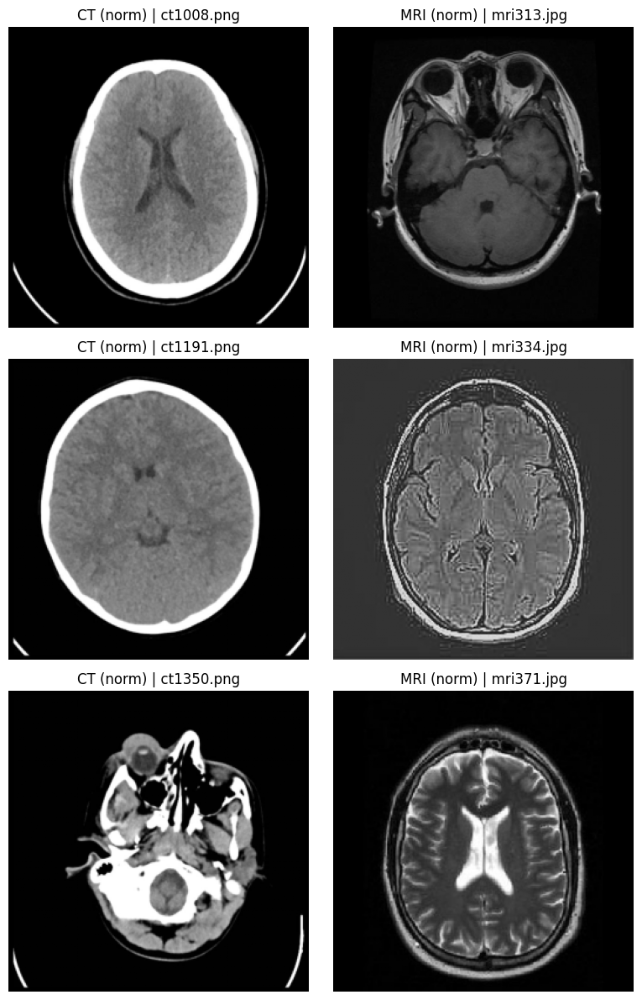


✓ Step 1 complete: dataset ready + paired paths built + independent normalization verified.
Next step will be: full Preprocessor + Augmentor + Dataset + DataLoader (still Objective #1).


In [2]:
# STEP 1 (from Task #1/#2): Download + locate dataset + build paired CT/MRI paths (robust) + basic sanity check
# Goal: start clean, ensure dataset path is correct, and CT/MRI pairs are aligned by filename.

import os
import numpy as np
from pathlib import Path
from typing import List, Tuple, Dict

import matplotlib.pyplot as plt
from PIL import Image
import cv2
import torch
import kagglehub

# -------------------------
# Config (edit only if needed)
# -------------------------
CFG = {
    "dataset_name": "darren2020/ct-to-mri-cgan",
    "target_size": (256, 256),
    "seed": 42,
    "max_pairs_debug": 3,   # quick visual check
}

np.random.seed(CFG["seed"])
torch.manual_seed(CFG["seed"])
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(CFG["seed"])

print("✓ Seeds set")
print("CUDA:", torch.cuda.is_available())

# -------------------------
# Download dataset
# -------------------------
print(f"\nDownloading dataset: {CFG['dataset_name']}")
dataset_root = Path(kagglehub.dataset_download(CFG["dataset_name"]))
print("✓ kagglehub dataset_root:", dataset_root)

if not dataset_root.exists():
    raise FileNotFoundError(f"Dataset root not found after download: {dataset_root}")

# -------------------------
# Helpers
# -------------------------
IMG_EXTS = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"}

def list_images(folder: Path) -> List[Path]:
    return sorted([p for p in folder.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS])

def pick_best_ct_mri_dirs(root: Path) -> Tuple[Path, Path]:
    """
    Robustly find CT and MRI directories by scanning for folders containing many images.
    Preference:
      - folder name contains 'ct' or 'mri'
      - has most images
    """
    candidates = []
    for d in [p for p in root.rglob("*") if p.is_dir()]:
        imgs = list_images(d)
        if len(imgs) == 0:
            continue
        name = d.name.lower()
        score = len(imgs)
        is_ct = ("ct" in name)
        is_mri = ("mri" in name)
        candidates.append((d, score, is_ct, is_mri))

    if not candidates:
        raise FileNotFoundError(f"No image folders found under: {root}")

    ct_dirs = sorted([c for c in candidates if c[2]], key=lambda x: x[1], reverse=True)
    mri_dirs = sorted([c for c in candidates if c[3]], key=lambda x: x[1], reverse=True)

    if ct_dirs and mri_dirs:
        return ct_dirs[0][0], mri_dirs[0][0]

    # fallback: try direct CT/MRI folder names anywhere
    named_ct = [c for c in candidates if c[0].name.lower() in {"ct", "cts"}]
    named_mri = [c for c in candidates if c[0].name.lower() in {"mri", "mris"}]
    if named_ct and named_mri:
        named_ct = sorted(named_ct, key=lambda x: x[1], reverse=True)
        named_mri = sorted(named_mri, key=lambda x: x[1], reverse=True)
        return named_ct[0][0], named_mri[0][0]

    raise FileNotFoundError(
        "Could not confidently detect CT/MRI folders.\n"
        f"Found image folders: {len(candidates)}. Please print candidates or set paths manually."
    )

def read_gray(path: Path) -> np.ndarray:
    try:
        img = Image.open(path).convert("L")
        return np.array(img, dtype=np.float32)
    except Exception:
        arr = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
        if arr is None:
            raise ValueError(f"Failed to load image: {path}")
        return arr.astype(np.float32)

def filename_key(p: Path) -> str:
    # key without extension for pairing
    return p.stem

# -------------------------
# Locate CT & MRI directories
# -------------------------
ct_dir, mri_dir = pick_best_ct_mri_dirs(dataset_root)
print("\n✓ Detected folders:")
print("CT :", ct_dir)
print("MRI:", mri_dir)

ct_imgs = list_images(ct_dir)
mri_imgs = list_images(mri_dir)
print(f"\n✓ Image counts: CT={len(ct_imgs)} MRI={len(mri_imgs)}")

if len(ct_imgs) == 0 or len(mri_imgs) == 0:
    raise FileNotFoundError("CT or MRI image list is empty after detection.")

# -------------------------
# Pairing by filename (IMPORTANT: maintains correspondence)
# -------------------------
ct_map = {filename_key(p): p for p in ct_imgs}
mri_map = {filename_key(p): p for p in mri_imgs}

common_keys = sorted(set(ct_map.keys()) & set(mri_map.keys()))
if len(common_keys) == 0:
    # fallback: pair by sorted order (last resort)
    print("⚠️ No matching filenames across CT/MRI. Falling back to sorted-order pairing.")
    n = min(len(ct_imgs), len(mri_imgs))
    paired_ct = ct_imgs[:n]
    paired_mri = mri_imgs[:n]
else:
    paired_ct = [ct_map[k] for k in common_keys]
    paired_mri = [mri_map[k] for k in common_keys]

print(f"✓ Paired samples: {len(paired_ct)}")

if len(paired_ct) < 10:
    print("⚠️ Very few pairs detected. If this is unexpected, print filenames to inspect pairing logic.")

# -------------------------
# Quick resize + independent minmax normalize (Objective #1 start)
# -------------------------
def resize_to(img: np.ndarray, target_hw: Tuple[int, int]) -> np.ndarray:
    h, w = target_hw
    interp = cv2.INTER_AREA if (img.shape[0] > h or img.shape[1] > w) else cv2.INTER_CUBIC
    return cv2.resize(img, (w, h), interpolation=interp).astype(np.float32)

def minmax_norm(img: np.ndarray) -> np.ndarray:
    mn = float(img.min())
    mx = float(img.max())
    return ((img - mn) / (mx - mn + 1e-8)).astype(np.float32)

print("\nVisual sanity check (first few paired samples):")
k = min(CFG["max_pairs_debug"], len(paired_ct))
fig, axes = plt.subplots(k, 2, figsize=(8, 4*k))

if k == 1:
    axes = np.array([axes])

for i in range(k):
    ct = read_gray(paired_ct[i])
    mri = read_gray(paired_mri[i])

    ct_r = resize_to(ct, CFG["target_size"])
    mri_r = resize_to(mri, CFG["target_size"])

    ct_n = minmax_norm(ct_r)   # independent normalize CT
    mri_n = minmax_norm(mri_r) # independent normalize MRI

    axes[i, 0].imshow(ct_n, cmap="gray")
    axes[i, 0].set_title(f"CT (norm) | {paired_ct[i].name}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mri_n, cmap="gray")
    axes[i, 1].set_title(f"MRI (norm) | {paired_mri[i].name}")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

print("\n✓ Step 1 complete: dataset ready + paired paths built + independent normalization verified.")
print("Next step will be: full Preprocessor + Augmentor + Dataset + DataLoader (still Objective #1).")


✓ Aligner ready


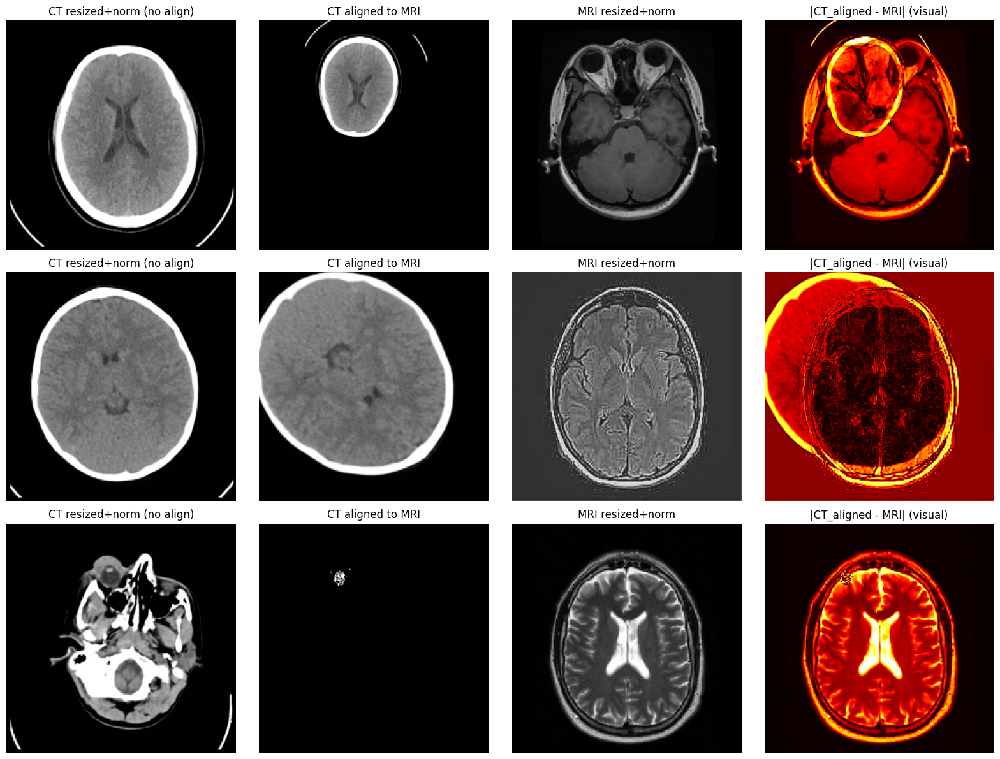

✓ Step 2 complete: resize + alignment pipeline verified.


In [3]:
# STEP 2 (Objective #1): Resize + ALIGN paired CT/MRI images (keeps anatomical correspondence)
# Uses: resize (high-quality) + optional ORB-based affine alignment (fast + safe fallback)

import numpy as np
import cv2
import matplotlib.pyplot as plt

# ---- Safety: ensure Step 1 variables exist
required = ["paired_ct", "paired_mri", "read_gray", "CFG"]
missing = [v for v in required if v not in globals()]
if missing:
    raise RuntimeError(f"Missing variables from Step 1: {missing}. Run Step 1 first.")

class CTMRIAligner:
    def __init__(self, target_size=(256, 256), nfeatures=1000, max_matches=50,
                 ransac_thresh=3.0, min_kp=10, min_matches=10):
        self.target_size = target_size
        self.nfeatures = nfeatures
        self.max_matches = max_matches
        self.ransac_thresh = ransac_thresh
        self.min_kp = min_kp
        self.min_matches = min_matches

    def resize(self, img: np.ndarray) -> np.ndarray:
        h, w = self.target_size
        interp = cv2.INTER_AREA if (img.shape[0] > h or img.shape[1] > w) else cv2.INTER_CUBIC
        return cv2.resize(img, (w, h), interpolation=interp).astype(np.float32)

    def minmax(self, img: np.ndarray) -> np.ndarray:
        mn = float(img.min()); mx = float(img.max())
        return ((img - mn) / (mx - mn + 1e-8)).astype(np.float32)

    def align_ct_to_mri(self, ct_norm: np.ndarray, mri_norm: np.ndarray) -> np.ndarray:
        """
        Align CT -> MRI using ORB + RANSAC affine.
        Returns aligned CT (float32, [0,1]) or original CT if alignment fails.
        """
        ct_u8 = (ct_norm * 255).astype(np.uint8)
        mri_u8 = (mri_norm * 255).astype(np.uint8)

        orb = cv2.ORB_create(nfeatures=self.nfeatures)
        kp1, des1 = orb.detectAndCompute(ct_u8, None)
        kp2, des2 = orb.detectAndCompute(mri_u8, None)

        if des1 is None or des2 is None or kp1 is None or kp2 is None:
            return ct_norm
        if len(kp1) < self.min_kp or len(kp2) < self.min_kp:
            return ct_norm

        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        if matches is None or len(matches) < self.min_matches:
            return ct_norm

        matches = sorted(matches, key=lambda x: x.distance)[: self.max_matches]
        if len(matches) < self.min_matches:
            return ct_norm

        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

        M, inliers = cv2.estimateAffinePartial2D(
            src_pts, dst_pts,
            method=cv2.RANSAC,
            ransacReprojThreshold=self.ransac_thresh
        )
        if M is None:
            return ct_norm

        h, w = ct_norm.shape
        ct_aligned = cv2.warpAffine(
            ct_norm, M, (w, h),
            flags=cv2.INTER_LINEAR,
            borderMode=cv2.BORDER_CONSTANT,
            borderValue=0
        ).astype(np.float32)

        return np.clip(ct_aligned, 0, 1)

    def preprocess_and_align_pair(self, ct_img: np.ndarray, mri_img: np.ndarray, do_align=True):
        ct_r = self.resize(ct_img)
        mri_r = self.resize(mri_img)

        ct_n = self.minmax(ct_r)
        mri_n = self.minmax(mri_r)

        if do_align:
            ct_a = self.align_ct_to_mri(ct_n, mri_n)
        else:
            ct_a = ct_n

        return ct_a, mri_n

aligner = CTMRIAligner(target_size=CFG["target_size"])
print("✓ Aligner ready")

# ---- Visual check: before vs after alignment for a few samples
k = min(3, len(paired_ct))
fig, axes = plt.subplots(k, 4, figsize=(16, 4*k))

if k == 1:
    axes = np.array([axes])

for i in range(k):
    ct = read_gray(paired_ct[i])
    mri = read_gray(paired_mri[i])

    ct_noalign, mri_proc = aligner.preprocess_and_align_pair(ct, mri, do_align=False)
    ct_align, _ = aligner.preprocess_and_align_pair(ct, mri, do_align=True)

    diff_noalign = np.abs(ct_noalign - mri_proc)
    diff_align = np.abs(ct_align - mri_proc)

    axes[i, 0].imshow(ct_noalign, cmap="gray")
    axes[i, 0].set_title("CT resized+norm (no align)")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(ct_align, cmap="gray")
    axes[i, 1].set_title("CT aligned to MRI")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(mri_proc, cmap="gray")
    axes[i, 2].set_title("MRI resized+norm")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(diff_align, cmap="hot")
    axes[i, 3].set_title("|CT_aligned - MRI| (visual)")
    axes[i, 3].axis("off")

plt.tight_layout()
plt.show()

print("✓ Step 2 complete: resize + alignment pipeline verified.")


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-4128722778.py:45: UserWarning: Argument(s) 'value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(
/tmp/ipython-input-4128722778.py:49: UserWarning: Argument(s) 'alpha_affine, value' are not valid for transform ElasticTransform
  A.ElasticTransform(
/tmp/ipython-input-4128722778.py:53: UserWarning: Argument(s) 'value' are not valid for transform GridDistortion
  A.GridDistortion(


✓ Augmentor ready (paired spatial + independent noise)


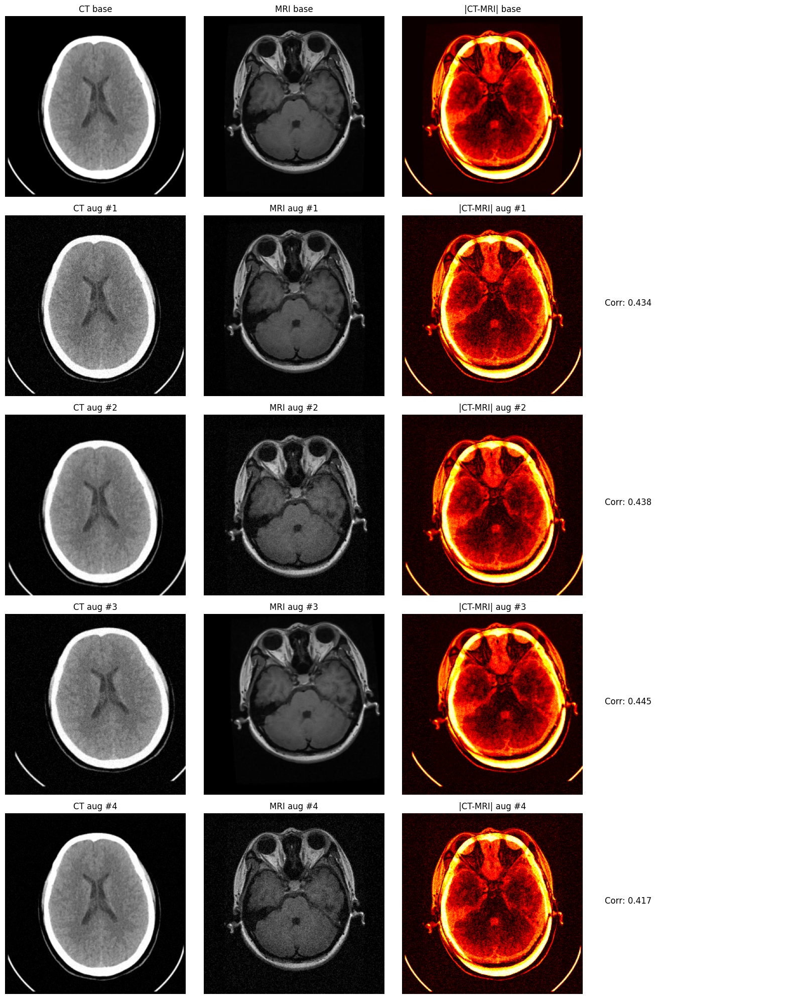

✓ Step 3 complete: spatial distortions + noise injection working with paired correspondence.


In [4]:
# STEP 3 (Objective #1): Data Augmentation for paired CT/MRI
# - Random noise injection (independent per modality)
# - Spatial distortions (synchronized to keep correspondence)
# Uses albumentations; geometric transforms are applied to BOTH ct & mri together.

import numpy as np
import cv2
import matplotlib.pyplot as plt
import albumentations as A

# ---- Safety: ensure Step 1/2 variables exist
required = ["paired_ct", "paired_mri", "read_gray", "CFG"]
missing = [v for v in required if v not in globals()]
if missing:
    raise RuntimeError(f"Missing variables: {missing}. Run Step 1 & Step 2 first.")

# ---- Basic resize+minmax (same as Step 2, but lightweight here)
def _resize(img: np.ndarray, target_hw):
    h, w = target_hw
    interp = cv2.INTER_AREA if (img.shape[0] > h or img.shape[1] > w) else cv2.INTER_CUBIC
    return cv2.resize(img, (w, h), interpolation=interp).astype(np.float32)

def _minmax(img: np.ndarray):
    mn = float(img.min()); mx = float(img.max())
    return ((img - mn) / (mx - mn + 1e-8)).astype(np.float32)

# -----------------------------
# Paired Augmentor
# -----------------------------
class CTMRIAugmentor:
    def __init__(
        self,
        p_geo=0.7,
        p_noise=0.6,
        noise_std_range=(0.00, 0.05),
        border_mode=cv2.BORDER_CONSTANT
    ):
        self.p_geo = p_geo
        self.p_noise = p_noise
        self.noise_std_range = noise_std_range

        # Synchronized spatial distortions (apply same transform to both)
        self.geo = A.Compose(
            [
                A.ShiftScaleRotate(
                    shift_limit=0.06, scale_limit=0.08, rotate_limit=10,
                    p=p_geo, border_mode=border_mode, value=0
                ),
                A.ElasticTransform(
                    alpha=1.0, sigma=40, alpha_affine=30,
                    p=0.25, border_mode=border_mode, value=0
                ),
                A.GridDistortion(
                    num_steps=5, distort_limit=0.20,
                    p=0.25, border_mode=border_mode, value=0
                ),
                A.HorizontalFlip(p=0.20),
            ],
            additional_targets={"mri": "image"},
        )

    def add_gaussian_noise(self, img: np.ndarray) -> np.ndarray:
        std = float(np.random.uniform(*self.noise_std_range))
        noise = np.random.normal(0.0, std, size=img.shape).astype(np.float32)
        out = img + noise
        return np.clip(out, 0.0, 1.0)

    def __call__(self, ct: np.ndarray, mri: np.ndarray):
        """
        ct, mri: float32 in [0,1], shape (H,W) or (H,W,1)
        returns augmented ct, mri (H,W) float32 [0,1]
        """
        if ct.ndim == 2: ct_in = ct[..., None]
        else: ct_in = ct
        if mri.ndim == 2: mri_in = mri[..., None]
        else: mri_in = mri

        # Synchronized spatial transforms
        out = self.geo(image=ct_in, mri=mri_in)
        ct_aug = out["image"]
        mri_aug = out["mri"]

        # Remove channel dim
        ct_aug = ct_aug.squeeze(-1) if ct_aug.shape[-1] == 1 else ct_aug
        mri_aug = mri_aug.squeeze(-1) if mri_aug.shape[-1] == 1 else mri_aug

        # Random noise injection (independent per modality)
        if np.random.rand() < self.p_noise:
            ct_aug = self.add_gaussian_noise(ct_aug)
        if np.random.rand() < self.p_noise:
            mri_aug = self.add_gaussian_noise(mri_aug)

        return ct_aug.astype(np.float32), mri_aug.astype(np.float32)

augmentor = CTMRIAugmentor(
    p_geo=0.7,
    p_noise=0.6,
    noise_std_range=(0.00, 0.05),
)

print("✓ Augmentor ready (paired spatial + independent noise)")

# -----------------------------
# Visualize augmentations
# -----------------------------
idx = 0
ct_raw = read_gray(paired_ct[idx])
mri_raw = read_gray(paired_mri[idx])

ct_base = _minmax(_resize(ct_raw, CFG["target_size"]))
mri_base = _minmax(_resize(mri_raw, CFG["target_size"]))

n = 4
fig, axes = plt.subplots(n + 1, 4, figsize=(16, 4*(n + 1)))

# Row 0: baseline
axes[0, 0].imshow(ct_base, cmap="gray"); axes[0, 0].set_title("CT base"); axes[0, 0].axis("off")
axes[0, 1].imshow(mri_base, cmap="gray"); axes[0, 1].set_title("MRI base"); axes[0, 1].axis("off")
axes[0, 2].imshow(np.abs(ct_base - mri_base), cmap="hot"); axes[0, 2].set_title("|CT-MRI| base"); axes[0, 2].axis("off")
axes[0, 3].axis("off")

for i in range(1, n + 1):
    ct_aug, mri_aug = augmentor(ct_base, mri_base)

    axes[i, 0].imshow(ct_aug, cmap="gray"); axes[i, 0].set_title(f"CT aug #{i}"); axes[i, 0].axis("off")
    axes[i, 1].imshow(mri_aug, cmap="gray"); axes[i, 1].set_title(f"MRI aug #{i}"); axes[i, 1].axis("off")
    axes[i, 2].imshow(np.abs(ct_aug - mri_aug), cmap="hot"); axes[i, 2].set_title(f"|CT-MRI| aug #{i}"); axes[i, 2].axis("off")

    # quick check: correlation to confirm correspondence isn't destroyed
    corr = np.corrcoef(ct_aug.flatten(), mri_aug.flatten())[0, 1]
    axes[i, 3].text(0.05, 0.5, f"Corr: {corr:.3f}", fontsize=12)
    axes[i, 3].axis("off")

plt.tight_layout()
plt.show()

print("✓ Step 3 complete: spatial distortions + noise injection working with paired correspondence.")


✓ Intensity augmentor ready (sync-geo + independent intensity)


/tmp/ipython-input-186841349.py:49: UserWarning: Argument(s) 'value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(
/tmp/ipython-input-186841349.py:53: UserWarning: Argument(s) 'alpha_affine, value' are not valid for transform ElasticTransform
  A.ElasticTransform(
/tmp/ipython-input-186841349.py:57: UserWarning: Argument(s) 'value' are not valid for transform GridDistortion
  A.GridDistortion(


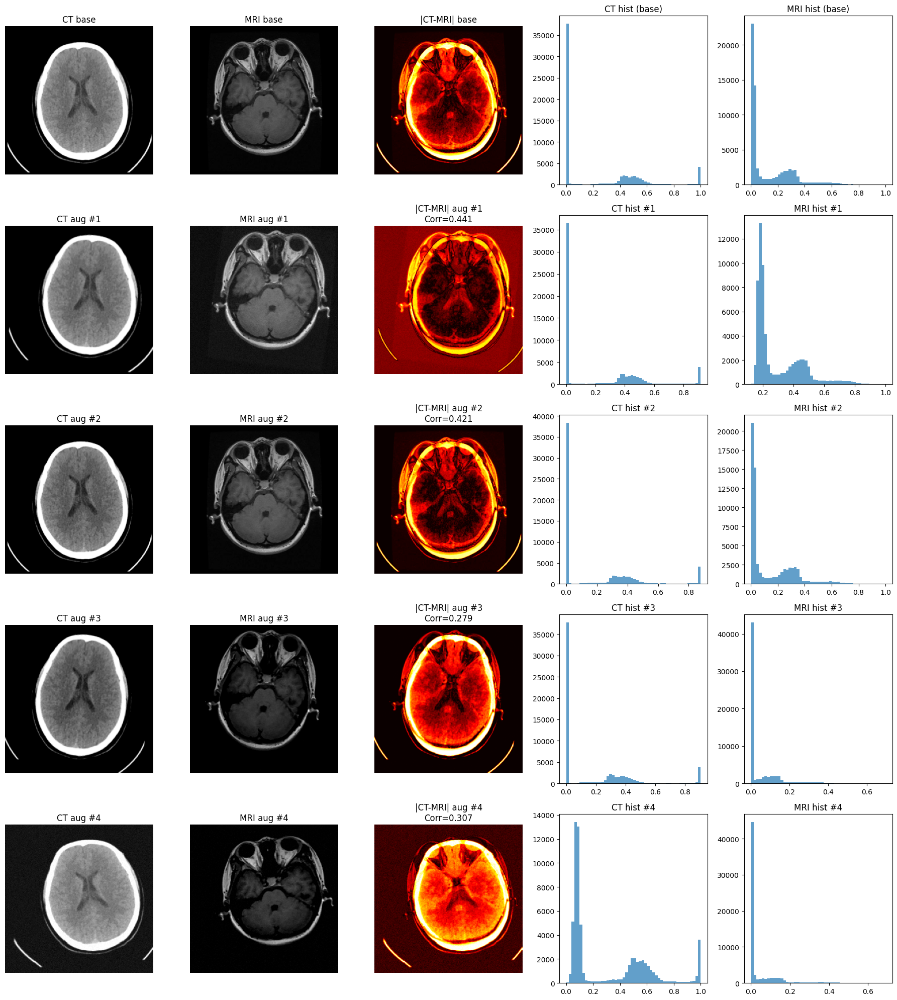

✓ Step 4 complete:
  - Geometry is synchronized → anatomical correspondence maintained.
  - Intensity is independent → realistic modality-specific variations added.


In [5]:
# STEP 4 (Objective #1): Intensity variations (modality-specific) + keep anatomical correspondence
# Rule:
#   - Geometric transforms MUST be synchronized (same for CT & MRI) to preserve anatomy alignment.
#   - Intensity transforms CAN be independent per modality (CT vs MRI), because anatomy geometry stays the same.

import numpy as np
import cv2
import matplotlib.pyplot as plt
import albumentations as A

# ---- Safety: ensure Step 1 variables exist
required = ["paired_ct", "paired_mri", "read_gray", "CFG"]
missing = [v for v in required if v not in globals()]
if missing:
    raise RuntimeError(f"Missing variables: {missing}. Run Step 1 first.")

# ---- Basic resize+minmax
def _resize(img: np.ndarray, target_hw):
    h, w = target_hw
    interp = cv2.INTER_AREA if (img.shape[0] > h or img.shape[1] > w) else cv2.INTER_CUBIC
    return cv2.resize(img, (w, h), interpolation=interp).astype(np.float32)

def _minmax(img: np.ndarray):
    mn = float(img.min()); mx = float(img.max())
    return ((img - mn) / (mx - mn + 1e-8)).astype(np.float32)

# -----------------------------
# Paired Augmentor: sync-geo + independent intensity
# -----------------------------
class CTMRIIntensityAugmentor:
    def __init__(
        self,
        p_geo=0.7,
        p_int_ct=0.8,
        p_int_mri=0.8,
        p_noise=0.4,
        noise_std_range=(0.0, 0.04),
        border_mode=cv2.BORDER_CONSTANT,
    ):
        self.p_geo = p_geo
        self.p_int_ct = p_int_ct
        self.p_int_mri = p_int_mri
        self.p_noise = p_noise
        self.noise_std_range = noise_std_range

        # (A) Synchronized geometry (keeps anatomical correspondence)
        self.geo = A.Compose(
            [
                A.ShiftScaleRotate(
                    shift_limit=0.06, scale_limit=0.08, rotate_limit=10,
                    p=p_geo, border_mode=border_mode, value=0
                ),
                A.ElasticTransform(
                    alpha=1.0, sigma=40, alpha_affine=30,
                    p=0.25, border_mode=border_mode, value=0
                ),
                A.GridDistortion(
                    num_steps=5, distort_limit=0.20,
                    p=0.25, border_mode=border_mode, value=0
                ),
                A.HorizontalFlip(p=0.20),
            ],
            additional_targets={"mri": "image"},
        )

        # (B) Intensity variations (modality-specific)
        # CT: mild contrast/brightness + gamma (CT is usually lower dynamic range after windowing)
        self.int_ct = A.Compose(
            [
                A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.15, p=p_int_ct),
                A.RandomGamma(gamma_limit=(85, 115), p=p_int_ct),
            ]
        )

        # MRI: a bit broader, plus optional bias/field-like variation via RandomBrightnessContrast + gamma
        self.int_mri = A.Compose(
            [
                A.RandomBrightnessContrast(brightness_limit=0.20, contrast_limit=0.20, p=p_int_mri),
                A.RandomGamma(gamma_limit=(80, 120), p=p_int_mri),
            ]
        )

    def _noise(self, img: np.ndarray) -> np.ndarray:
        std = float(np.random.uniform(*self.noise_std_range))
        return np.clip(img + np.random.normal(0.0, std, img.shape).astype(np.float32), 0.0, 1.0)

    def __call__(self, ct: np.ndarray, mri: np.ndarray):
        """
        Inputs: ct, mri float32 [0,1], shape (H,W)
        Output: ct_aug, mri_aug float32 [0,1], shape (H,W)
        """
        ct_in = ct[..., None] if ct.ndim == 2 else ct
        mri_in = mri[..., None] if mri.ndim == 2 else mri

        # 1) synchronized geometry
        out = self.geo(image=ct_in, mri=mri_in)
        ct_g = out["image"].squeeze(-1) if out["image"].shape[-1] == 1 else out["image"]
        mri_g = out["mri"].squeeze(-1) if out["mri"].shape[-1] == 1 else out["mri"]

        # 2) independent intensity (DOES NOT break correspondence)
        ct_i = self.int_ct(image=ct_g)["image"]
        mri_i = self.int_mri(image=mri_g)["image"]

        # 3) optional independent noise
        if np.random.rand() < self.p_noise:
            ct_i = self._noise(ct_i)
        if np.random.rand() < self.p_noise:
            mri_i = self._noise(mri_i)

        return ct_i.astype(np.float32), mri_i.astype(np.float32)

augmentor_int = CTMRIIntensityAugmentor(
    p_geo=0.7,
    p_int_ct=0.85,
    p_int_mri=0.85,
    p_noise=0.4,
    noise_std_range=(0.0, 0.04),
)

print("✓ Intensity augmentor ready (sync-geo + independent intensity)")

# -----------------------------
# Visual proof: anatomy preserved (geometry sync) while intensity differs
# -----------------------------
idx = 0
ct_raw = read_gray(paired_ct[idx])
mri_raw = read_gray(paired_mri[idx])

ct_base = _minmax(_resize(ct_raw, CFG["target_size"]))
mri_base = _minmax(_resize(mri_raw, CFG["target_size"]))

n = 4
fig, axes = plt.subplots(n + 1, 5, figsize=(18, 4*(n + 1)))

# Baseline row
axes[0, 0].imshow(ct_base, cmap="gray"); axes[0, 0].set_title("CT base"); axes[0, 0].axis("off")
axes[0, 1].imshow(mri_base, cmap="gray"); axes[0, 1].set_title("MRI base"); axes[0, 1].axis("off")
axes[0, 2].imshow(np.abs(ct_base - mri_base), cmap="hot"); axes[0, 2].set_title("|CT-MRI| base"); axes[0, 2].axis("off")
axes[0, 3].hist(ct_base.flatten(), bins=50, alpha=0.7); axes[0, 3].set_title("CT hist (base)")
axes[0, 4].hist(mri_base.flatten(), bins=50, alpha=0.7); axes[0, 4].set_title("MRI hist (base)")

for i in range(1, n + 1):
    ct_aug, mri_aug = augmentor_int(ct_base, mri_base)

    # "correspondence" check: high structural similarity proxy via correlation
    corr = np.corrcoef(ct_aug.flatten(), mri_aug.flatten())[0, 1]

    axes[i, 0].imshow(ct_aug, cmap="gray"); axes[i, 0].set_title(f"CT aug #{i}"); axes[i, 0].axis("off")
    axes[i, 1].imshow(mri_aug, cmap="gray"); axes[i, 1].set_title(f"MRI aug #{i}"); axes[i, 1].axis("off")
    axes[i, 2].imshow(np.abs(ct_aug - mri_aug), cmap="hot"); axes[i, 2].set_title(f"|CT-MRI| aug #{i}"); axes[i, 2].axis("off")
    axes[i, 3].hist(ct_aug.flatten(), bins=50, alpha=0.7); axes[i, 3].set_title(f"CT hist #{i}")
    axes[i, 4].hist(mri_aug.flatten(), bins=50, alpha=0.7); axes[i, 4].set_title(f"MRI hist #{i}")

    # annotate correspondence metric on the |diff| panel title
    axes[i, 2].set_title(f"|CT-MRI| aug #{i}\nCorr={corr:.3f}")

plt.tight_layout()
plt.show()

print("✓ Step 4 complete:")
print("  - Geometry is synchronized → anatomical correspondence maintained.")
print("  - Intensity is independent → realistic modality-specific variations added.")


In [6]:
### 2. Feature Extraction

In [7]:
# STEP 5 (Objective #2): Feature Extraction using a Convolutional Autoencoder (CAE)
# - Uses your Task #2 "fast and good" style: simple, efficient CAE + AMP + AdamW
# - Trains on paired CT–MRI as "normal" (reconstruct both + cross-modal mismatch)
# - After training, extracts latent vectors (ct_z, mri_z) for feature-based anomaly methods later

import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm

# -------------------------
# Safety checks (from Steps 1-4)
# -------------------------
needed = ["paired_ct", "paired_mri", "read_gray", "CFG"]
missing = [v for v in needed if v not in globals()]
if missing:
    raise RuntimeError(f"Missing from previous steps: {missing}. Run Steps 1-4 first.")

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
torch.backends.cudnn.benchmark = True if DEVICE == "cuda" else False

# -------------------------
# Minimal paired Dataset (uses Step-4 augmentor if present)
# -------------------------
def _resize(img: np.ndarray, target_hw):
    import cv2
    h, w = target_hw
    interp = cv2.INTER_AREA if (img.shape[0] > h or img.shape[1] > w) else cv2.INTER_CUBIC
    return cv2.resize(img, (w, h), interpolation=interp).astype(np.float32)

def _minmax(img: np.ndarray):
    mn = float(img.min()); mx = float(img.max())
    return ((img - mn) / (mx - mn + 1e-8)).astype(np.float32)

class PairedCTMRIDataset(Dataset):
    def __init__(self, ct_paths, mri_paths, target_size=(256,256), augmentor=None, training=True):
        assert len(ct_paths) == len(mri_paths)
        self.ct_paths = ct_paths
        self.mri_paths = mri_paths
        self.target_size = target_size
        self.augmentor = augmentor if training else None

    def __len__(self):
        return len(self.ct_paths)

    def __getitem__(self, idx):
        ct = read_gray(self.ct_paths[idx])
        mri = read_gray(self.mri_paths[idx])

        ct = _minmax(_resize(ct, self.target_size))
        mri = _minmax(_resize(mri, self.target_size))

        if self.augmentor is not None:
            ct, mri = self.augmentor(ct, mri)

        ct_t = torch.from_numpy(ct).unsqueeze(0)  # [1,H,W]
        mri_t = torch.from_numpy(mri).unsqueeze(0)
        return {"ct": ct_t, "mri": mri_t}

# -------------------------
# Split (simple deterministic split)
# -------------------------
n = len(paired_ct)
perm = np.random.RandomState(CFG["seed"]).permutation(n)
val_n = int(0.15 * n)
test_n = int(0.15 * n)
train_n = n - val_n - test_n

tr_idx = perm[:train_n]
va_idx = perm[train_n:train_n+val_n]
te_idx = perm[train_n+val_n:]

train_ct = [paired_ct[i] for i in tr_idx]
train_mri = [paired_mri[i] for i in tr_idx]
val_ct   = [paired_ct[i] for i in va_idx]
val_mri  = [paired_mri[i] for i in va_idx]
test_ct  = [paired_ct[i] for i in te_idx]
test_mri = [paired_mri[i] for i in te_idx]

# use Step-4 augmentor if exists, else no aug
AUG = globals().get("augmentor_int", None)

train_ds = PairedCTMRIDataset(train_ct, train_mri, CFG["target_size"], augmentor=AUG, training=True)
val_ds   = PairedCTMRIDataset(val_ct,   val_mri,   CFG["target_size"], augmentor=None, training=False)
test_ds  = PairedCTMRIDataset(test_ct,  test_mri,  CFG["target_size"], augmentor=None, training=False)

BATCH = 8
NW = 2 if os.name != "nt" else 0

train_loader = DataLoader(train_ds, batch_size=BATCH, shuffle=True, num_workers=NW,
                          pin_memory=(DEVICE=="cuda"), drop_last=True)
val_loader   = DataLoader(val_ds, batch_size=BATCH, shuffle=False, num_workers=NW,
                          pin_memory=(DEVICE=="cuda"))
test_loader  = DataLoader(test_ds, batch_size=BATCH, shuffle=False, num_workers=NW,
                          pin_memory=(DEVICE=="cuda"))

print(f"✓ DataLoaders ready: train={len(train_loader)} val={len(val_loader)} test={len(test_loader)}")

# -------------------------
# CAE blocks (fast + stable)
# -------------------------
class ConvEncoder(nn.Module):
    def __init__(self, in_ch=1, base=64, latent_dim=256):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, base, 4, 2, 1), nn.BatchNorm2d(base), nn.LeakyReLU(0.2, inplace=True),    # 256->128
            nn.Conv2d(base, base*2, 4, 2, 1), nn.BatchNorm2d(base*2), nn.LeakyReLU(0.2, inplace=True),# 128->64
            nn.Conv2d(base*2, base*4, 4, 2, 1), nn.BatchNorm2d(base*4), nn.LeakyReLU(0.2, inplace=True),# 64->32
            nn.Conv2d(base*4, base*8, 4, 2, 1), nn.BatchNorm2d(base*8), nn.LeakyReLU(0.2, inplace=True),# 32->16
            nn.Conv2d(base*8, base*8, 4, 2, 1), nn.BatchNorm2d(base*8), nn.LeakyReLU(0.2, inplace=True),# 16->8
        )
        self.fc = nn.Linear(base*8*8*8, latent_dim)

    def forward(self, x):
        h = self.net(x)
        z = self.fc(h.flatten(1))
        return z

class ConvDecoder(nn.Module):
    def __init__(self, out_ch=1, base=64, latent_dim=256):
        super().__init__()
        self.base = base
        self.fc = nn.Linear(latent_dim, base*8*8*8)
        self.net = nn.Sequential(
            nn.ConvTranspose2d(base*8, base*8, 4, 2, 1), nn.BatchNorm2d(base*8), nn.ReLU(inplace=True), # 8->16
            nn.ConvTranspose2d(base*8, base*4, 4, 2, 1), nn.BatchNorm2d(base*4), nn.ReLU(inplace=True), # 16->32
            nn.ConvTranspose2d(base*4, base*2, 4, 2, 1), nn.BatchNorm2d(base*2), nn.ReLU(inplace=True), # 32->64
            nn.ConvTranspose2d(base*2, base, 4, 2, 1), nn.BatchNorm2d(base), nn.ReLU(inplace=True),     # 64->128
            nn.ConvTranspose2d(base, out_ch, 4, 2, 1), nn.Sigmoid()                                      # 128->256
        )

    def forward(self, z):
        h = self.fc(z).view(-1, self.base*8, 8, 8)
        return self.net(h)

class SharedLatentCAE(nn.Module):
    """
    Paired CT/MRI encoders into shared latent space.
    Decoders for:
      - recon CT, recon MRI
      - CT->MRI, MRI->CT
    """
    def __init__(self, latent_dim=256, base=64):
        super().__init__()
        self.ct_enc = ConvEncoder(1, base, latent_dim)
        self.mri_enc = ConvEncoder(1, base, latent_dim)
        self.ct_dec = ConvDecoder(1, base, latent_dim)
        self.mri_dec = ConvDecoder(1, base, latent_dim)

    def forward(self, ct, mri):
        ct_z = self.ct_enc(ct)
        mri_z = self.mri_enc(mri)
        ct_recon = self.ct_dec(ct_z)
        mri_recon = self.mri_dec(mri_z)
        ct_to_mri = self.mri_dec(ct_z)
        mri_to_ct = self.ct_dec(mri_z)
        return {
            "ct_z": ct_z, "mri_z": mri_z,
            "ct_recon": ct_recon, "mri_recon": mri_recon,
            "ct_to_mri": ct_to_mri, "mri_to_ct": mri_to_ct
        }

model_cae = SharedLatentCAE(latent_dim=256, base=64).to(DEVICE)
print("✓ CAE model created")

# -------------------------
# Loss (recon + cross-recon + latent alignment)
# -------------------------
def latent_alignment_loss(a, b):
    a = F.normalize(a, dim=1)
    b = F.normalize(b, dim=1)
    return 1.0 - (a * b).sum(dim=1).mean()

def total_loss_fn(out, ct, mri, w_recon=1.0, w_cross=0.5, w_align=0.1):
    ct_rec = F.mse_loss(out["ct_recon"], ct)
    mri_rec = F.mse_loss(out["mri_recon"], mri)
    ct2m = F.mse_loss(out["ct_to_mri"], mri)
    m2ct = F.mse_loss(out["mri_to_ct"], ct)
    align = latent_alignment_loss(out["ct_z"], out["mri_z"])
    total = w_recon*(ct_rec + mri_rec) + w_cross*(ct2m + m2ct) + w_align*align
    return total, {"ct_rec": ct_rec.item(), "mri_rec": mri_rec.item(), "align": align.item()}

# -------------------------
# Training (fast)
# -------------------------
opt = torch.optim.AdamW(model_cae.parameters(), lr=1e-4, weight_decay=1e-5)
scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE=="cuda"))

EPOCHS = 8  # keep small for "step-by-step"; increase later
best_val = 1e9

for ep in range(1, EPOCHS+1):
    model_cae.train()
    tr_loss = 0.0
    for batch in tqdm(train_loader, desc=f"Train ep {ep}/{EPOCHS}", leave=False):
        ct = batch["ct"].to(DEVICE, non_blocking=True)
        mri = batch["mri"].to(DEVICE, non_blocking=True)

        opt.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):
            out = model_cae(ct, mri)
            loss, _ = total_loss_fn(out, ct, mri)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model_cae.parameters(), 1.0)
        scaler.step(opt)
        scaler.update()
        tr_loss += float(loss.item())

    tr_loss /= max(1, len(train_loader))

    model_cae.eval()
    va_loss = 0.0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Val ep {ep}/{EPOCHS}", leave=False):
            ct = batch["ct"].to(DEVICE, non_blocking=True)
            mri = batch["mri"].to(DEVICE, non_blocking=True)
            with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):
                out = model_cae(ct, mri)
                loss, _ = total_loss_fn(out, ct, mri)
            va_loss += float(loss.item())
    va_loss /= max(1, len(val_loader))

    print(f"Epoch {ep}: train={tr_loss:.6f}  val={va_loss:.6f}")

    if va_loss < best_val:
        best_val = va_loss
        best_state = {k: v.detach().cpu().clone() for k, v in model_cae.state_dict().items()}

# load best
model_cae.load_state_dict(best_state)
print(f"✓ Training done. Best val loss = {best_val:.6f}")

# -------------------------
# Feature extraction (latent representations)
# -------------------------
@torch.no_grad()
def extract_latents(model, loader, device):
    model.eval()
    ct_zs, mri_zs = [], []
    for batch in tqdm(loader, desc="Extract latents", leave=False):
        ct = batch["ct"].to(device, non_blocking=True)
        mri = batch["mri"].to(device, non_blocking=True)
        out = model(ct, mri)
        ct_zs.append(out["ct_z"].detach().cpu().numpy())
        mri_zs.append(out["mri_z"].detach().cpu().numpy())
    return np.concatenate(ct_zs, axis=0), np.concatenate(mri_zs, axis=0)

train_ct_z, train_mri_z = extract_latents(model_cae, train_loader, DEVICE)
val_ct_z, val_mri_z     = extract_latents(model_cae, val_loader, DEVICE)
test_ct_z, test_mri_z   = extract_latents(model_cae, test_loader, DEVICE)

print("✓ Latents extracted:")
print("  train ct_z:", train_ct_z.shape, "train mri_z:", train_mri_z.shape)
print("  val   ct_z:", val_ct_z.shape,   "val   mri_z:", val_mri_z.shape)
print("  test  ct_z:", test_ct_z.shape,  "test  mri_z:", test_mri_z.shape)

# Make variables available for next steps
model = model_cae
CONFIG = {"model_type": "multimodal", "latent_dim": 256, "train_modality": "ct"}
print("✓ Ready for next step: anomaly scoring (recon error + cross-modal mismatch + latent inconsistency)")


✓ DataLoaders ready: train=1 val=1 test=1
✓ CAE model created


/tmp/ipython-input-2122393234.py:191: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE=="cuda"))


Train ep 1/8:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-2122393234.py:204: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):


Val ep 1/8:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-2122393234.py:222: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):


Epoch 1: train=0.795469  val=0.613442


Train ep 2/8:   0%|          | 0/1 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b01fe762840>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b01fe762840>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Val ep 2/8:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2: train=0.749796  val=0.591328


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times


Train ep 3/8:   0%|          | 0/1 [00:00<?, ?it/s]

Val ep 3/8:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 3: train=0.689690  val=0.576319


Train ep 4/8:   0%|          | 0/1 [00:00<?, ?it/s]

Val ep 4/8:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 4: train=0.652175  val=0.561843


Train ep 5/8:   0%|          | 0/1 [00:00<?, ?it/s]

Val ep 5/8:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 5: train=0.643168  val=0.545374


Train ep 6/8:   0%|          | 0/1 [00:00<?, ?it/s]

Val ep 6/8:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 6: train=0.622010  val=0.526579


Train ep 7/8:   0%|          | 0/1 [00:00<?, ?it/s]

Val ep 7/8:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 7: train=0.585594  val=0.504449


Train ep 8/8:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

Val ep 8/8:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 8: train=0.599460  val=0.479357


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times


✓ Training done. Best val loss = 0.479357


Extract latents:   0%|          | 0/1 [00:00<?, ?it/s]

Extract latents:   0%|          | 0/1 [00:00<?, ?it/s]

Extract latents:   0%|          | 0/1 [00:00<?, ?it/s]

✓ Latents extracted:
  train ct_z: (8, 256) train mri_z: (8, 256)
  val   ct_z: (2, 256) val   mri_z: (2, 256)
  test  ct_z: (2, 256) test  mri_z: (2, 256)
✓ Ready for next step: anomaly scoring (recon error + cross-modal mismatch + latent inconsistency)


In [8]:
# =============================================================================
# CELL 6 (SAFE): Model Architectures - Variational Autoencoder (memory-friendly)
# - Same idea as your code (Conv encoder -> mu/logvar -> reparam -> ConvDecoder)
# - Reduced memory defaults + AMP-friendly
# =============================================================================

import torch
import torch.nn as nn
import torch.nn.functional as F

print("✓ Building VAE (memory-safe version)")

# --------- tweak ONLY these if needed ----------
VAE_LATENT_DIM = 256       # was 512 (reduce RAM a lot)
VAE_BASE_CH = 32           # was 64  (reduce RAM a lot)
USE_GROUPNORM = True       # more stable for small batches
# ----------------------------------------------

def _norm(ch):
    if USE_GROUPNORM:
        g = 8 if ch >= 8 else 1
        return nn.GroupNorm(g, ch)
    return nn.BatchNorm2d(ch)

class VariationalEncoder(nn.Module):
    """VAE Encoder - outputs mean and log-variance."""
    def __init__(self, in_channels=1, latent_dim=VAE_LATENT_DIM, base_channels=VAE_BASE_CH):
        super().__init__()

        self.encoder = nn.Sequential(
            # 256 -> 128
            nn.Conv2d(in_channels, base_channels, 4, 2, 1),
            _norm(base_channels),
            nn.LeakyReLU(0.2, inplace=True),

            # 128 -> 64
            nn.Conv2d(base_channels, base_channels*2, 4, 2, 1),
            _norm(base_channels*2),
            nn.LeakyReLU(0.2, inplace=True),

            # 64 -> 32
            nn.Conv2d(base_channels*2, base_channels*4, 4, 2, 1),
            _norm(base_channels*4),
            nn.LeakyReLU(0.2, inplace=True),

            # 32 -> 16
            nn.Conv2d(base_channels*4, base_channels*8, 4, 2, 1),
            _norm(base_channels*8),
            nn.LeakyReLU(0.2, inplace=True),

            # 16 -> 8
            nn.Conv2d(base_channels*8, base_channels*8, 4, 2, 1),
            _norm(base_channels*8),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.flatten = nn.Flatten()
        hidden_dim = base_channels*8 * 8 * 8
        self.fc_mu = nn.Linear(hidden_dim, latent_dim)
        self.fc_logvar = nn.Linear(hidden_dim, latent_dim)

    def forward(self, x):
        features = self.encoder(x)
        features_flat = self.flatten(features)
        mu = self.fc_mu(features_flat)
        logvar = self.fc_logvar(features_flat)
        return mu, logvar

class ConvolutionalDecoder(nn.Module):
    """CNN Decoder for autoencoder."""
    def __init__(self, out_channels=1, latent_dim=VAE_LATENT_DIM, base_channels=VAE_BASE_CH):
        super().__init__()

        self.base_channels = base_channels
        self.fc_latent = nn.Linear(latent_dim, base_channels*8 * 8 * 8)

        self.decoder = nn.Sequential(
            # 8 -> 16
            nn.ConvTranspose2d(base_channels*8, base_channels*8, 4, 2, 1),
            _norm(base_channels*8),
            nn.ReLU(inplace=True),

            # 16 -> 32
            nn.ConvTranspose2d(base_channels*8, base_channels*4, 4, 2, 1),
            _norm(base_channels*4),
            nn.ReLU(inplace=True),

            # 32 -> 64
            nn.ConvTranspose2d(base_channels*4, base_channels*2, 4, 2, 1),
            _norm(base_channels*2),
            nn.ReLU(inplace=True),

            # 64 -> 128
            nn.ConvTranspose2d(base_channels*2, base_channels, 4, 2, 1),
            _norm(base_channels),
            nn.ReLU(inplace=True),

            # 128 -> 256
            nn.ConvTranspose2d(base_channels, out_channels, 4, 2, 1),
            nn.Sigmoid()
        )

    def forward(self, z):
        features = self.fc_latent(z)
        features = features.view(-1, self.base_channels*8, 8, 8)
        x_recon = self.decoder(features)
        return x_recon

class VariationalAutoencoder(nn.Module):
    """VAE with reparameterization trick."""
    def __init__(self, in_channels=1, latent_dim=VAE_LATENT_DIM, base_channels=VAE_BASE_CH):
        super().__init__()
        self.encoder = VariationalEncoder(in_channels, latent_dim, base_channels)
        self.decoder = ConvolutionalDecoder(in_channels, latent_dim, base_channels)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar, z

    def encode(self, x, sample=True):
        mu, logvar = self.encoder(x)
        return self.reparameterize(mu, logvar) if sample else mu

print("✓ Variational Autoencoder (SAFE) defined")

# ---- quick sanity check (won't allocate much) ----
device = "cuda" if torch.cuda.is_available() else "cpu"
vae = VariationalAutoencoder().to(device)
x = torch.randn(2, 1, 256, 256, device=device)
with torch.no_grad():
    recon, mu, logvar, z = vae(x)
print("✓ Sanity forward pass ok:",
      "recon", tuple(recon.shape),
      "mu", tuple(mu.shape),
      "logvar", tuple(logvar.shape),
      "z", tuple(z.shape))


✓ Building VAE (memory-safe version)
✓ Variational Autoencoder (SAFE) defined
✓ Sanity forward pass ok: recon (2, 1, 256, 256) mu (2, 256) logvar (2, 256) z (2, 256)


In [9]:
# =============================================================================
# VAE TRAINING CELL (prints epochs) - GPU + AMP + memory-safe
# Assumes: train_loader, val_loader already exist (from your CELL 4)
# Uses: the "vae" model created below
# =============================================================================

import os
import torch
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm.auto import tqdm

print("✓ VAE Training Started")

device = "cuda" if torch.cuda.is_available() else "cpu"

# ---------- IMPORTANT MEMORY SETTINGS ----------
BATCH_LIMIT_NOTE = "If you crash, lower batch_size in DataLoader to 4 or 2."
print("Device:", device, "|", BATCH_LIMIT_NOTE)

# Use the SAFE VAE from previous cell (or re-create it here)
vae = VariationalAutoencoder().to(device)

optimizer = AdamW(vae.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=3, min_lr=1e-7)

scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))

def vae_loss(recon, x, mu, logvar, kl_weight=1e-3):
    recon_loss = F.mse_loss(recon, x) + 0.5 * F.l1_loss(recon, x)
    kl = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1).mean()
    total = recon_loss + kl_weight * kl
    return total, recon_loss.detach(), kl.detach()

def train_one_epoch(model, loader, epoch, num_epochs, kl_weight):
    model.train()
    running = 0.0

    pbar = tqdm(loader, desc=f"Train Epoch {epoch}/{num_epochs}", leave=False)
    for batch in pbar:
        x = batch["ct"].to(device)  # training on CT (change to "mri" if needed)

        optimizer.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=(device == "cuda")):
            recon, mu, logvar, z = model(x)
            loss, recon_l, kl_l = vae_loss(recon, x, mu, logvar, kl_weight=kl_weight)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer)
        scaler.update()

        running += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}", recon=f"{recon_l.item():.4f}", kl=f"{kl_l.item():.4f}")

    return running / max(1, len(loader))

@torch.no_grad()
def validate(model, loader, epoch, num_epochs, kl_weight):
    model.eval()
    running = 0.0

    pbar = tqdm(loader, desc=f"Val   Epoch {epoch}/{num_epochs}", leave=False)
    for batch in pbar:
        x = batch["ct"].to(device)

        with torch.cuda.amp.autocast(enabled=(device == "cuda")):
            recon, mu, logvar, z = model(x)
            loss, recon_l, kl_l = vae_loss(recon, x, mu, logvar, kl_weight=kl_weight)

        running += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}", recon=f"{recon_l.item():.4f}", kl=f"{kl_l.item():.4f}")

    return running / max(1, len(loader))

# ----------------- TRAIN CONFIG -----------------
num_epochs = 10
save_dir = "./checkpoints"
os.makedirs(save_dir, exist_ok=True)

best_val = float("inf")
patience = 5
pat = 0

for epoch in range(1, num_epochs + 1):
    # Simple KL warmup (prevents early collapse + stabilizes)
    kl_weight = 1e-3 * min(1.0, epoch / max(1, (num_epochs * 0.5)))

    train_loss = train_one_epoch(vae, train_loader, epoch, num_epochs, kl_weight)
    val_loss = validate(vae, val_loader, epoch, num_epochs, kl_weight)

    scheduler.step(val_loss)
    lr = optimizer.param_groups[0]["lr"]

    print(f"Epoch {epoch:02d}/{num_epochs} | Train {train_loss:.5f} | Val {val_loss:.5f} | KLw {kl_weight:.2e} | LR {lr:.2e}")

    if val_loss < best_val:
        best_val = val_loss
        pat = 0
        torch.save({"model": vae.state_dict(), "epoch": epoch, "val_loss": val_loss}, f"{save_dir}/best_vae_ct.pth")
        print("  ✓ Saved best VAE checkpoint")
    else:
        pat += 1
        if pat >= patience:
            print("Early stopping triggered.")
            break

print("✓ VAE training complete. Best Val Loss:", best_val)


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

✓ VAE Training Started
Device: cuda | If you crash, lower batch_size in DataLoader to 4 or 2.


/tmp/ipython-input-4092423321.py:28: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))


Train Epoch 1/10:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-4092423321.py:46: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Val   Epoch 1/10:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-4092423321.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Epoch 01/10 | Train 0.42381 | Val 0.36956 | KLw 2.00e-04 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 2/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 2/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 02/10 | Train 0.40761 | Val 0.35807 | KLw 4.00e-04 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 3/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 3/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 03/10 | Train 0.39579 | Val 0.34552 | KLw 6.00e-04 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 4/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 4/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 04/10 | Train 0.37178 | Val 0.33372 | KLw 8.00e-04 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 5/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 5/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 05/10 | Train 0.35410 | Val 0.32374 | KLw 1.00e-03 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 6/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 6/10:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

Epoch 06/10 | Train 0.33401 | Val 0.31418 | KLw 1.00e-03 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 7/10:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times


Val   Epoch 7/10:   0%|          | 0/1 [00:05<?, ?it/s]

Epoch 07/10 | Train 0.31704 | Val 0.30420 | KLw 1.00e-03 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 8/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 8/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 08/10 | Train 0.31641 | Val 0.29738 | KLw 1.00e-03 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 9/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 9/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 09/10 | Train 0.30755 | Val 0.29067 | KLw 1.00e-03 | LR 1.00e-04
  ✓ Saved best VAE checkpoint


Train Epoch 10/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 10/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10/10 | Train 0.29324 | Val 0.28512 | KLw 1.00e-03 | LR 1.00e-04
  ✓ Saved best VAE checkpoint
✓ VAE training complete. Best Val Loss: 0.28512465953826904


In [10]:
# =============================================================================
# TRANSFORMER-BASED AUTOENCODER TRAINING CELL (prints epochs) - GPU + AMP
# Assumes: train_loader, val_loader already exist (from your dataset cell)
# Trains on CT by default (change batch["ct"] -> batch["mri"] if needed)
# =============================================================================

import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm.auto import tqdm

print("✓ Transformer AE Training Started")

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# ---------------- Transformer Components ----------------
class MultiHeadAttention(nn.Module):
    def __init__(self, embed_dim=256, num_heads=8, dropout=0.1):
        super().__init__()
        assert embed_dim % num_heads == 0
        self.num_heads = num_heads
        self.head_dim = embed_dim // num_heads
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(embed_dim, embed_dim * 3)
        self.proj = nn.Linear(embed_dim, embed_dim)
        self.drop = nn.Dropout(dropout)

    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, self.head_dim).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        attn = self.drop(attn)
        out = (attn @ v).transpose(1, 2).reshape(B, N, C)
        return self.drop(self.proj(out))

class TransformerBlock(nn.Module):
    def __init__(self, embed_dim=256, num_heads=8, mlp_ratio=4.0, dropout=0.1):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_dim)
        self.attn = MultiHeadAttention(embed_dim, num_heads, dropout)
        self.norm2 = nn.LayerNorm(embed_dim)
        hidden = int(embed_dim * mlp_ratio)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, hidden),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden, embed_dim),
            nn.Dropout(dropout)
        )

    def forward(self, x):
        x = x + self.attn(self.norm1(x))
        x = x + self.mlp(self.norm2(x))
        return x

class TransformerEncoder(nn.Module):
    def __init__(self, img_size=256, patch_size=16, in_channels=1, embed_dim=256, depth=4, num_heads=8, latent_dim=256):
        super().__init__()
        assert img_size % patch_size == 0
        self.patch_embed = nn.Conv2d(in_channels, embed_dim, kernel_size=patch_size, stride=patch_size)
        num_patches = (img_size // patch_size) ** 2
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches + 1, embed_dim))
        self.drop = nn.Dropout(0.1)
        self.blocks = nn.ModuleList([TransformerBlock(embed_dim, num_heads, 4.0, 0.1) for _ in range(depth)])
        self.norm = nn.LayerNorm(embed_dim)
        self.to_latent = nn.Linear(embed_dim, latent_dim)
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

    def forward(self, x):
        B = x.shape[0]
        x = self.patch_embed(x)                 # [B, C, H/ps, W/ps]
        x = x.flatten(2).transpose(1, 2)        # [B, N, C]
        cls = self.cls_token.expand(B, -1, -1)  # [B, 1, C]
        x = torch.cat([cls, x], dim=1)
        x = self.drop(x + self.pos_embed)

        for blk in self.blocks:
            x = blk(x)

        x = self.norm(x)
        z = self.to_latent(x[:, 0])
        return z

# Use your existing CNN decoder (re-defined here to keep this cell self-contained)
class ConvolutionalDecoder(nn.Module):
    def __init__(self, out_channels=1, latent_dim=256, base_channels=64):
        super().__init__()
        self.base_channels = base_channels
        self.fc = nn.Linear(latent_dim, base_channels * 8 * 8 * 8)
        self.dec = nn.Sequential(
            nn.ConvTranspose2d(base_channels * 8, base_channels * 8, 4, 2, 1),
            nn.BatchNorm2d(base_channels * 8),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(base_channels * 8, base_channels * 4, 4, 2, 1),
            nn.BatchNorm2d(base_channels * 4),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(base_channels * 4, base_channels * 2, 4, 2, 1),
            nn.BatchNorm2d(base_channels * 2),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(base_channels * 2, base_channels, 4, 2, 1),
            nn.BatchNorm2d(base_channels),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(base_channels, out_channels, 4, 2, 1),
            nn.Sigmoid()
        )

    def forward(self, z):
        x = self.fc(z).view(-1, self.base_channels * 8, 8, 8)
        return self.dec(x)

class TransformerAutoencoder(nn.Module):
    def __init__(self, img_size=256, patch_size=16, in_channels=1, embed_dim=256, depth=4, num_heads=8, latent_dim=256, base_channels=64):
        super().__init__()
        self.encoder = TransformerEncoder(img_size, patch_size, in_channels, embed_dim, depth, num_heads, latent_dim)
        self.decoder = ConvolutionalDecoder(in_channels, latent_dim, base_channels)

    def forward(self, x):
        z = self.encoder(x)
        recon = self.decoder(z)
        return recon, z

# ---------------- Model ----------------
model = TransformerAutoencoder(
    img_size=256, patch_size=16,
    in_channels=1,
    embed_dim=256,   # lowered vs 768 to save memory
    depth=4,         # lowered vs 6 to save memory
    num_heads=8,
    latent_dim=256,
    base_channels=64
).to(device)

optimizer = AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=3, min_lr=1e-7)
scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))

def recon_loss_fn(recon, x):
    return F.mse_loss(recon, x) + 0.5 * F.l1_loss(recon, x)

def train_one_epoch(model, loader, epoch, num_epochs, modality_key="ct"):
    model.train()
    running = 0.0
    pbar = tqdm(loader, desc=f"Train Epoch {epoch}/{num_epochs}", leave=False)
    for batch in pbar:
        x = batch[modality_key].to(device)

        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(device == "cuda")):
            recon, z = model(x)
            loss = recon_loss_fn(recon, x)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer)
        scaler.update()

        running += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")
    return running / max(1, len(loader))

@torch.no_grad()
def validate(model, loader, epoch, num_epochs, modality_key="ct"):
    model.eval()
    running = 0.0
    pbar = tqdm(loader, desc=f"Val   Epoch {epoch}/{num_epochs}", leave=False)
    for batch in pbar:
        x = batch[modality_key].to(device)
        with torch.cuda.amp.autocast(enabled=(device == "cuda")):
            recon, z = model(x)
            loss = recon_loss_fn(recon, x)
        running += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")
    return running / max(1, len(loader))

# ---------------- Training ----------------
num_epochs = 10
save_dir = "./checkpoints"
os.makedirs(save_dir, exist_ok=True)

best_val = float("inf")
patience = 5
pat = 0

modality_key = "ct"  # change to "mri" if you want

for epoch in range(1, num_epochs + 1):
    tr = train_one_epoch(model, train_loader, epoch, num_epochs, modality_key)
    va = validate(model, val_loader, epoch, num_epochs, modality_key)
    scheduler.step(va)
    lr = optimizer.param_groups[0]["lr"]

    print(f"Epoch {epoch:02d}/{num_epochs} | Train {tr:.5f} | Val {va:.5f} | LR {lr:.2e}")

    if va < best_val:
        best_val = va
        pat = 0
        torch.save({"model": model.state_dict(), "epoch": epoch, "val_loss": va}, f"{save_dir}/best_transformerAE_{modality_key}.pth")
        print("  ✓ Saved best TransformerAE checkpoint")
    else:
        pat += 1
        if pat >= patience:
            print("Early stopping triggered.")
            break

print("✓ Transformer AE training complete. Best Val Loss:", best_val)


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception ignored in: <function _ConnectionBase.__del__ at 0x7b01ad7534c0>
Traceback (most recent call last):
  File "/usr/lib/python3.12

✓ Transformer AE Training Started
Device: cuda


/tmp/ipython-input-2209505783.py:147: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))


Train Epoch 1/10:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-2209505783.py:160: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Val   Epoch 1/10:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-2209505783.py:180: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Epoch 01/10 | Train 0.54221 | Val 0.29596 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 2/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 2/10:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

Epoch 02/10 | Train 0.53714 | Val 0.29522 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 3/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 3/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 03/10 | Train 0.51692 | Val 0.29443 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 4/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 4/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 04/10 | Train 0.49537 | Val 0.29320 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 5/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 5/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 05/10 | Train 0.49943 | Val 0.29170 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 6/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 6/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 06/10 | Train 0.48279 | Val 0.28998 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 7/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 7/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 07/10 | Train 0.47344 | Val 0.28798 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 8/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 8/10:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

Epoch 08/10 | Train 0.45414 | Val 0.28569 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 9/10:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times


Val   Epoch 9/10:   0%|          | 0/1 [00:05<?, ?it/s]

Epoch 09/10 | Train 0.44136 | Val 0.28310 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint


Train Epoch 10/10:   0%|          | 0/1 [00:00<?, ?it/s]

Val   Epoch 10/10:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10/10 | Train 0.43695 | Val 0.28025 | LR 1.00e-04
  ✓ Saved best TransformerAE checkpoint
✓ Transformer AE training complete. Best Val Loss: 0.28025034070014954


In [11]:
# =============================================================================
# MULTI-MODAL (CT + MRI) SHARED LATENT TRAINING CELL
# Learns:
# 1) Modality-specific features (CT encoder, MRI encoder)
# 2) Shared latent representations (alignment loss + cross-reconstruction)
# Assumes: train_loader, val_loader exist and each batch has batch["ct"], batch["mri"]
# =============================================================================

import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm.auto import tqdm

print("✓ Multi-modal Shared Latent Training Started")

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# ---------------- Models (same style as your code, but self-contained) ----------------
class ConvolutionalEncoder(nn.Module):
    def __init__(self, in_channels=1, latent_dim=256, base_channels=32):
        super().__init__()
        self.enc = nn.Sequential(
            nn.Conv2d(in_channels, base_channels, 4, 2, 1), nn.BatchNorm2d(base_channels), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_channels, base_channels*2, 4, 2, 1), nn.BatchNorm2d(base_channels*2), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_channels*2, base_channels*4, 4, 2, 1), nn.BatchNorm2d(base_channels*4), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_channels*4, base_channels*8, 4, 2, 1), nn.BatchNorm2d(base_channels*8), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_channels*8, base_channels*8, 4, 2, 1), nn.BatchNorm2d(base_channels*8), nn.LeakyReLU(0.2, inplace=True),
        )
        self.flat = nn.Flatten()
        self.fc = nn.Linear(base_channels*8 * 8 * 8, latent_dim)

    def forward(self, x):
        h = self.enc(x)
        z = self.fc(self.flat(h))
        return z

class ConvolutionalDecoder(nn.Module):
    def __init__(self, out_channels=1, latent_dim=256, base_channels=32):
        super().__init__()
        self.base_channels = base_channels
        self.fc = nn.Linear(latent_dim, base_channels*8 * 8 * 8)
        self.dec = nn.Sequential(
            nn.ConvTranspose2d(base_channels*8, base_channels*8, 4, 2, 1), nn.BatchNorm2d(base_channels*8), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_channels*8, base_channels*4, 4, 2, 1), nn.BatchNorm2d(base_channels*4), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_channels*4, base_channels*2, 4, 2, 1), nn.BatchNorm2d(base_channels*2), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_channels*2, base_channels, 4, 2, 1), nn.BatchNorm2d(base_channels), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_channels, out_channels, 4, 2, 1), nn.Sigmoid()
        )

    def forward(self, z):
        h = self.fc(z).view(-1, self.base_channels*8, 8, 8)
        return self.dec(h)

class SharedLatentAutoencoder(nn.Module):
    def __init__(self, latent_dim=256, base_channels=32):
        super().__init__()
        self.ct_encoder = ConvolutionalEncoder(1, latent_dim, base_channels)
        self.mri_encoder = ConvolutionalEncoder(1, latent_dim, base_channels)
        self.ct_decoder = ConvolutionalDecoder(1, latent_dim, base_channels)
        self.mri_decoder = ConvolutionalDecoder(1, latent_dim, base_channels)

    def forward(self, ct_img, mri_img):
        ct_z = self.ct_encoder(ct_img)
        mri_z = self.mri_encoder(mri_img)

        ct_recon = self.ct_decoder(ct_z)
        mri_recon = self.mri_decoder(mri_z)

        ct_to_mri = self.mri_decoder(ct_z)
        mri_to_ct = self.ct_decoder(mri_z)

        return {
            "ct_z": ct_z, "mri_z": mri_z,
            "ct_recon": ct_recon, "mri_recon": mri_recon,
            "ct_to_mri": ct_to_mri, "mri_to_ct": mri_to_ct
        }

# ---------------- Losses ----------------
def recon_loss(recon, target):
    return F.mse_loss(recon, target) + 0.5 * F.l1_loss(recon, target)

def alignment_loss(ct_z, mri_z):
    ct = F.normalize(ct_z, p=2, dim=1)
    mri = F.normalize(mri_z, p=2, dim=1)
    cos = (ct * mri).sum(dim=1).mean()
    return 1.0 - cos

def total_multimodal_loss(out, ct, mri, w_recon=1.0, w_cross=0.5, w_align=0.1):
    ct_re = recon_loss(out["ct_recon"], ct)
    mri_re = recon_loss(out["mri_recon"], mri)
    ct2m = recon_loss(out["ct_to_mri"], mri)
    m2ct = recon_loss(out["mri_to_ct"], ct)
    align = alignment_loss(out["ct_z"], out["mri_z"])
    total = w_recon * (ct_re + mri_re) + w_cross * (ct2m + m2ct) + w_align * align
    return total, ct_re, mri_re, ct2m, m2ct, align

# ---------------- Train Setup ----------------
LATENT_DIM = 256
BASE_CH = 32
NUM_EPOCHS = 10
LR = 1e-4
WD = 1e-5
PATIENCE = 5
SAVE_DIR = "./checkpoints"
os.makedirs(SAVE_DIR, exist_ok=True)

model = SharedLatentAutoencoder(latent_dim=LATENT_DIM, base_channels=BASE_CH).to(device)
optimizer = AdamW(model.parameters(), lr=LR, weight_decay=WD)
scheduler = ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=3, min_lr=1e-7)

scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))

best_val = float("inf")
pat = 0

def train_epoch(loader):
    model.train()
    tot = ct_re = mri_re = ct2m = m2ct = algn = 0.0

    pbar = tqdm(loader, desc="Train", leave=False)
    for batch in pbar:
        ct = batch["ct"].to(device)
        mri = batch["mri"].to(device)

        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(device == "cuda")):
            out = model(ct, mri)
            loss, l_ct, l_mri, l_ct2m, l_m2ct, l_al = total_multimodal_loss(out, ct, mri)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer)
        scaler.update()

        tot += loss.item()
        ct_re += l_ct.item()
        mri_re += l_mri.item()
        ct2m += l_ct2m.item()
        m2ct += l_m2ct.item()
        algn += l_al.item()

        pbar.set_postfix(loss=f"{loss.item():.4f}", align=f"{l_al.item():.4f}")

    n = max(1, len(loader))
    return tot/n, ct_re/n, mri_re/n, ct2m/n, m2ct/n, algn/n

@torch.no_grad()
def val_epoch(loader):
    model.eval()
    tot = ct_re = mri_re = ct2m = m2ct = algn = 0.0

    pbar = tqdm(loader, desc="Val", leave=False)
    for batch in pbar:
        ct = batch["ct"].to(device)
        mri = batch["mri"].to(device)

        with torch.cuda.amp.autocast(enabled=(device == "cuda")):
            out = model(ct, mri)
            loss, l_ct, l_mri, l_ct2m, l_m2ct, l_al = total_multimodal_loss(out, ct, mri)

        tot += loss.item()
        ct_re += l_ct.item()
        mri_re += l_mri.item()
        ct2m += l_ct2m.item()
        m2ct += l_m2ct.item()
        algn += l_al.item()

        pbar.set_postfix(loss=f"{loss.item():.4f}", align=f"{l_al.item():.4f}")

    n = max(1, len(loader))
    return tot/n, ct_re/n, mri_re/n, ct2m/n, m2ct/n, algn/n

# ---------------- Training Loop (prints epochs) ----------------
for epoch in range(1, NUM_EPOCHS + 1):
    tr = train_epoch(train_loader)
    va = val_epoch(val_loader)
    scheduler.step(va[0])
    lr_now = optimizer.param_groups[0]["lr"]

    print(
        f"Epoch {epoch:02d}/{NUM_EPOCHS} | "
        f"Train total {tr[0]:.5f} (CT {tr[1]:.4f}, MRI {tr[2]:.4f}, X {tr[3]+tr[4]:.4f}, Align {tr[5]:.4f}) | "
        f"Val total {va[0]:.5f} (CT {va[1]:.4f}, MRI {va[2]:.4f}, X {va[3]+va[4]:.4f}, Align {va[5]:.4f}) | "
        f"LR {lr_now:.2e}"
    )

    if va[0] < best_val:
        best_val = va[0]
        pat = 0
        torch.save({"model": model.state_dict(), "epoch": epoch, "val_loss": best_val},
                   f"{SAVE_DIR}/best_shared_latent.pth")
        print("  ✓ Saved best shared-latent checkpoint")
    else:
        pat += 1
        if pat >= PATIENCE:
            print("Early stopping triggered.")
            break

print("✓ Done. Best Val Loss:", best_val)

# ---------------- Quick sanity metric: CT↔MRI latent similarity on one val batch ----------------
@torch.no_grad()
def latent_similarity_on_batch():
    model.eval()
    batch = next(iter(val_loader))
    ct = batch["ct"].to(device)
    mri = batch["mri"].to(device)
    out = model(ct, mri)
    ct_z = F.normalize(out["ct_z"], p=2, dim=1)
    mri_z = F.normalize(out["mri_z"], p=2, dim=1)
    cos = (ct_z * mri_z).sum(dim=1)
    print(f"Latent cosine similarity (val batch): mean={cos.mean().item():.4f}, std={cos.std().item():.4f}")

latent_similarity_on_batch()


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

✓ Multi-modal Shared Latent Training Started
Device: cuda


/tmp/ipython-input-3427382752.py:115: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))


Train:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-3427382752.py:130: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 01/10 | Train total 1.09938 (CT 0.3317, MRI 0.3359, X 0.6604, Align 1.0152) | Val total 1.05335 (CT 0.2851, MRI 0.3662, X 0.6514, Align 0.7630) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


/tmp/ipython-input-3427382752.py:161: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 02/10 | Train total 1.01762 (CT 0.3308, MRI 0.2938, X 0.6258, Align 0.8013) | Val total 1.03932 (CT 0.2838, MRI 0.3672, X 0.6510, Align 0.6287) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 03/10 | Train total 1.00602 (CT 0.3261, MRI 0.3077, X 0.6327, Align 0.5583) | Val total 1.02833 (CT 0.2820, MRI 0.3669, X 0.6490, Align 0.5488) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 04/10 | Train total 0.96279 (CT 0.3160, MRI 0.3025, X 0.6181, Align 0.3519) | Val total 1.01791 (CT 0.2801, MRI 0.3661, X 0.6461, Align 0.4872) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 05/10 | Train total 0.95178 (CT 0.3190, MRI 0.2883, X 0.6110, Align 0.3892) | Val total 1.00702 (CT 0.2778, MRI 0.3646, X 0.6424, Align 0.4342) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 06/10 | Train total 0.93434 (CT 0.3134, MRI 0.2875, X 0.6023, Align 0.3235) | Val total 0.99506 (CT 0.2752, MRI 0.3625, X 0.6377, Align 0.3850) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 07/10 | Train total 0.90686 (CT 0.3122, MRI 0.2787, X 0.5924, Align 0.1983) | Val total 0.98270 (CT 0.2725, MRI 0.3597, X 0.6322, Align 0.3438) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times


Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 08/10 | Train total 0.92333 (CT 0.3159, MRI 0.2848, X 0.6048, Align 0.2026) | Val total 0.96960 (CT 0.2696, MRI 0.3562, X 0.6258, Align 0.3083) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 09/10 | Train total 0.92724 (CT 0.3059, MRI 0.2992, X 0.6099, Align 0.1718) | Val total 0.95600 (CT 0.2667, MRI 0.3520, X 0.6187, Align 0.2793) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10/10 | Train total 0.87644 (CT 0.3025, MRI 0.2736, X 0.5790, Align 0.1078) | Val total 0.94137 (CT 0.2637, MRI 0.3470, X 0.6107, Align 0.2521) | LR 1.00e-04
  ✓ Saved best shared-latent checkpoint
✓ Done. Best Val Loss: 0.9413699507713318
Latent cosine similarity (val batch): mean=0.7479, std=0.0124


In [12]:
### 3. Unsupervised Anomaly Detection Methods


✓ AE-based Detection (Train + Score) Started
Device: cuda

TRAINING AE (NORMAL ONLY)


/tmp/ipython-input-73993176.py:113: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-73993176.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-73993176.py:148: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Epoch 01/10 | Train 1.17139 | Val 1.06572 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 02/10 | Train 1.14591 | Val 1.04765 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

Epoch 03/10 | Train 1.10294 | Val 1.03307 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 04/10 | Train 1.08704 | Val 1.01888 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 05/10 | Train 1.04852 | Val 1.00532 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 06/10 | Train 1.04614 | Val 0.99175 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 07/10 | Train 1.03176 | Val 0.97821 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 08/10 | Train 1.02548 | Val 0.96459 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Val AE:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

Epoch 09/10 | Train 1.01557 | Val 0.95015 | LR 1.00e-04
  ✓ Saved best AE checkpoint


Train AE:   0%|          | 0/1 [00:00<?, ?it/s]

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times


Val AE:   0%|          | 0/1 [00:05<?, ?it/s]

Epoch 10/10 | Train 1.02829 | Val 0.93557 | LR 1.00e-04
  ✓ Saved best AE checkpoint
✓ AE training done. Best Val: 0.9355735182762146


Scoring:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring:   0%|          | 0/1 [00:00<?, ?it/s]

✓ Scores computed
val_anom_ae: (2,)  min/mean/max: 1.1600549221038818 1.3050038814544678 1.4499529600143433
test_anom_ae: (2,)  min/mean/max: 1.4001682996749878 1.4280531406402588 1.4559381008148193


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

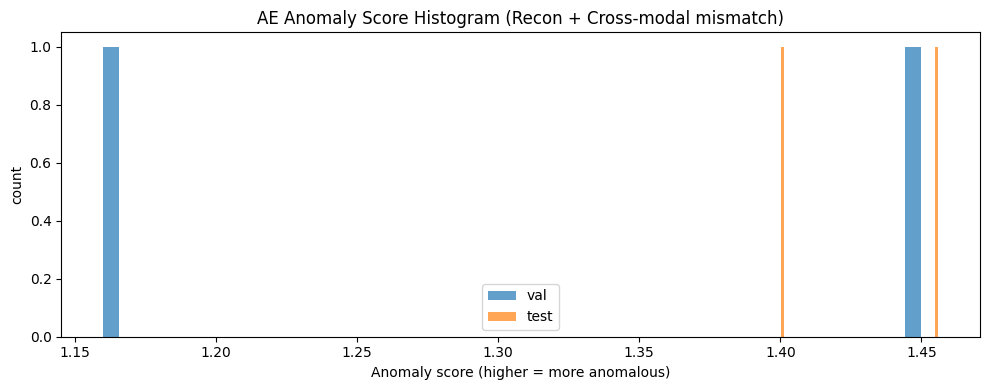

In [13]:
# =============================================================================
# TASK: Autoencoder-Based Anomaly Detection (CT–MRI)
# - Trains ONLY on normal CT–MRI pairs (assumes your train_loader is "normal")
# - Detect anomalies using:
#   1) Reconstruction error (CT->CT, MRI->MRI)
#   2) Cross-modal reconstruction mismatch (CT->MRI, MRI->CT)
#
# Produces:
#   val_anom_ae, test_anom_ae  (higher = more anomalous)
#   plus per-component score dicts for analysis
#
# Assumes:
#   train_loader, val_loader, test_loader exist
#   each batch has batch["ct"], batch["mri"]
# =============================================================================

import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm.auto import tqdm

print("✓ AE-based Detection (Train + Score) Started")

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# ---------------- Model (Shared Latent AE) ----------------
class ConvolutionalEncoder(nn.Module):
    def __init__(self, in_channels=1, latent_dim=256, base_channels=32):
        super().__init__()
        self.enc = nn.Sequential(
            nn.Conv2d(in_channels, base_channels, 4, 2, 1), nn.BatchNorm2d(base_channels), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_channels, base_channels*2, 4, 2, 1), nn.BatchNorm2d(base_channels*2), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_channels*2, base_channels*4, 4, 2, 1), nn.BatchNorm2d(base_channels*4), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_channels*4, base_channels*8, 4, 2, 1), nn.BatchNorm2d(base_channels*8), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_channels*8, base_channels*8, 4, 2, 1), nn.BatchNorm2d(base_channels*8), nn.LeakyReLU(0.2, inplace=True),
        )
        self.flat = nn.Flatten()
        self.fc = nn.Linear(base_channels*8 * 8 * 8, latent_dim)

    def forward(self, x):
        return self.fc(self.flat(self.enc(x)))

class ConvolutionalDecoder(nn.Module):
    def __init__(self, out_channels=1, latent_dim=256, base_channels=32):
        super().__init__()
        self.base_channels = base_channels
        self.fc = nn.Linear(latent_dim, base_channels*8 * 8 * 8)
        self.dec = nn.Sequential(
            nn.ConvTranspose2d(base_channels*8, base_channels*8, 4, 2, 1), nn.BatchNorm2d(base_channels*8), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_channels*8, base_channels*4, 4, 2, 1), nn.BatchNorm2d(base_channels*4), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_channels*4, base_channels*2, 4, 2, 1), nn.BatchNorm2d(base_channels*2), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_channels*2, base_channels, 4, 2, 1), nn.BatchNorm2d(base_channels), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_channels, out_channels, 4, 2, 1), nn.Sigmoid()
        )

    def forward(self, z):
        h = self.fc(z).view(-1, self.base_channels*8, 8, 8)
        return self.dec(h)

class SharedLatentAutoencoder(nn.Module):
    def __init__(self, latent_dim=256, base_channels=32):
        super().__init__()
        self.ct_encoder = ConvolutionalEncoder(1, latent_dim, base_channels)
        self.mri_encoder = ConvolutionalEncoder(1, latent_dim, base_channels)
        self.ct_decoder = ConvolutionalDecoder(1, latent_dim, base_channels)
        self.mri_decoder = ConvolutionalDecoder(1, latent_dim, base_channels)

    def forward(self, ct, mri):
        ct_z = self.ct_encoder(ct)
        mri_z = self.mri_encoder(mri)
        ct_recon = self.ct_decoder(ct_z)
        mri_recon = self.mri_decoder(mri_z)
        ct_to_mri = self.mri_decoder(ct_z)
        mri_to_ct = self.ct_decoder(mri_z)
        return {"ct_z": ct_z, "mri_z": mri_z, "ct_recon": ct_recon, "mri_recon": mri_recon, "ct_to_mri": ct_to_mri, "mri_to_ct": mri_to_ct}

# ---------------- Loss ----------------
def recon_loss(xhat, x):
    return F.mse_loss(xhat, x) + 0.5 * F.l1_loss(xhat, x)

def align_loss(ct_z, mri_z):
    a = F.normalize(ct_z, p=2, dim=1)
    b = F.normalize(mri_z, p=2, dim=1)
    return 1.0 - (a * b).sum(dim=1).mean()

def multimodal_train_loss(out, ct, mri, w_recon=1.0, w_cross=0.5, w_align=0.1):
    l_ct = recon_loss(out["ct_recon"], ct)
    l_mri = recon_loss(out["mri_recon"], mri)
    l_ct2m = recon_loss(out["ct_to_mri"], mri)
    l_m2ct = recon_loss(out["mri_to_ct"], ct)
    l_align = align_loss(out["ct_z"], out["mri_z"])
    total = w_recon * (l_ct + l_mri) + w_cross * (l_ct2m + l_m2ct) + w_align * l_align
    return total, l_ct, l_mri, l_ct2m, l_m2ct, l_align

# ---------------- Train Config ----------------
LATENT_DIM = 256
BASE_CH = 32
EPOCHS = 10
LR = 1e-4
WD = 1e-5
PATIENCE = 5
SAVE_DIR = "./checkpoints"
os.makedirs(SAVE_DIR, exist_ok=True)

model_ae = SharedLatentAutoencoder(latent_dim=LATENT_DIM, base_channels=BASE_CH).to(device)
opt = AdamW(model_ae.parameters(), lr=LR, weight_decay=WD)
sch = ReduceLROnPlateau(opt, mode="min", factor=0.5, patience=3, min_lr=1e-7)
scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))

best_val = float("inf")
pat = 0

def train_epoch(loader):
    model_ae.train()
    tot = 0.0
    pbar = tqdm(loader, desc="Train AE", leave=False)
    for batch in pbar:
        ct = batch["ct"].to(device)
        mri = batch["mri"].to(device)

        opt.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(device == "cuda")):
            out = model_ae(ct, mri)
            loss, *_ = multimodal_train_loss(out, ct, mri)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model_ae.parameters(), 1.0)
        scaler.step(opt)
        scaler.update()

        tot += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")
    return tot / max(1, len(loader))

@torch.no_grad()
def val_epoch(loader):
    model_ae.eval()
    tot = 0.0
    pbar = tqdm(loader, desc="Val AE", leave=False)
    for batch in pbar:
        ct = batch["ct"].to(device)
        mri = batch["mri"].to(device)
        with torch.cuda.amp.autocast(enabled=(device == "cuda")):
            out = model_ae(ct, mri)
            loss, *_ = multimodal_train_loss(out, ct, mri)
        tot += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")
    return tot / max(1, len(loader))

print("\n====================")
print("TRAINING AE (NORMAL ONLY)")
print("====================")

for ep in range(1, EPOCHS + 1):
    tr = train_epoch(train_loader)
    va = val_epoch(val_loader)
    sch.step(va)
    lr_now = opt.param_groups[0]["lr"]

    print(f"Epoch {ep:02d}/{EPOCHS} | Train {tr:.5f} | Val {va:.5f} | LR {lr_now:.2e}")

    if va < best_val:
        best_val = va
        pat = 0
        torch.save({"model": model_ae.state_dict(), "epoch": ep, "val_loss": best_val},
                   f"{SAVE_DIR}/best_ae_multimodal.pth")
        print("  ✓ Saved best AE checkpoint")
    else:
        pat += 1
        if pat >= PATIENCE:
            print("Early stopping.")
            break

print("✓ AE training done. Best Val:", best_val)

# =============================================================================
# SCORING: Reconstruction error + Cross-modal mismatch
# Score per pair:
#   score = mean(|ct-ct_recon|) + mean(|mri-mri_recon|) + mean(|mri-ct_to_mri|) + mean(|ct-mri_to_ct|)
# =============================================================================

@torch.no_grad()
def score_loader(loader):
    model_ae.eval()
    total_scores = []
    parts = {"ct_recon": [], "mri_recon": [], "ct_to_mri": [], "mri_to_ct": []}

    for batch in tqdm(loader, desc="Scoring", leave=False):
        ct = batch["ct"].to(device)
        mri = batch["mri"].to(device)

        out = model_ae(ct, mri)

        ct_re = torch.mean(torch.abs(ct - out["ct_recon"]), dim=(1,2,3))
        mri_re = torch.mean(torch.abs(mri - out["mri_recon"]), dim=(1,2,3))
        ct2m  = torch.mean(torch.abs(mri - out["ct_to_mri"]), dim=(1,2,3))
        m2ct  = torch.mean(torch.abs(ct - out["mri_to_ct"]), dim=(1,2,3))

        score = ct_re + mri_re + ct2m + m2ct

        total_scores.append(score.detach().cpu().numpy())
        parts["ct_recon"].append(ct_re.detach().cpu().numpy())
        parts["mri_recon"].append(mri_re.detach().cpu().numpy())
        parts["ct_to_mri"].append(ct2m.detach().cpu().numpy())
        parts["mri_to_ct"].append(m2ct.detach().cpu().numpy())

    total_scores = np.concatenate(total_scores, axis=0)
    for k in parts:
        parts[k] = np.concatenate(parts[k], axis=0)
    return total_scores, parts

val_anom_ae, val_parts_ae = score_loader(val_loader)
test_anom_ae, test_parts_ae = score_loader(test_loader)

print("✓ Scores computed")
print("val_anom_ae:", val_anom_ae.shape, " min/mean/max:", float(val_anom_ae.min()), float(val_anom_ae.mean()), float(val_anom_ae.max()))
print("test_anom_ae:", test_anom_ae.shape, " min/mean/max:", float(test_anom_ae.min()), float(test_anom_ae.mean()), float(test_anom_ae.max()))

# (Optional) quick histogram
import matplotlib.pyplot as plt
plt.figure(figsize=(10,4))
plt.hist(val_anom_ae, bins=50, alpha=0.7, label="val")
plt.hist(test_anom_ae, bins=50, alpha=0.7, label="test")
plt.title("AE Anomaly Score Histogram (Recon + Cross-modal mismatch)")
plt.xlabel("Anomaly score (higher = more anomalous)")
plt.ylabel("count")
plt.legend()
plt.tight_layout()
plt.show()


✓ One-Class Learning Started
Using MULTI-MODAL features: concat(ct_z, mri_z)


Extract feats (multi):   0%|          | 0/1 [00:00<?, ?it/s]

Extract feats (multi):   0%|          | 0/1 [00:00<?, ?it/s]

Extract feats (multi):   0%|          | 0/1 [00:00<?, ?it/s]

Feature shapes: (8, 512) (2, 512) (2, 512)
✓ One-Class SVM done
val_anom_ocsvm: (2,)  min/mean/max: 0.047894510465625866 0.050875965031452294 0.05385741959727872
test_anom_ocsvm: (2,)  min/mean/max: 0.04841460445820438 0.05463683334806912 0.06085906223793386
✓ Isolation Forest done
val_anom_if: (2,)  min/mean/max: 0.4860695059826139 0.48885118999499044 0.49163287400736705
test_anom_if: (2,)  min/mean/max: 0.5006200761042213 0.5010317673856132 0.501443458667005


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 25

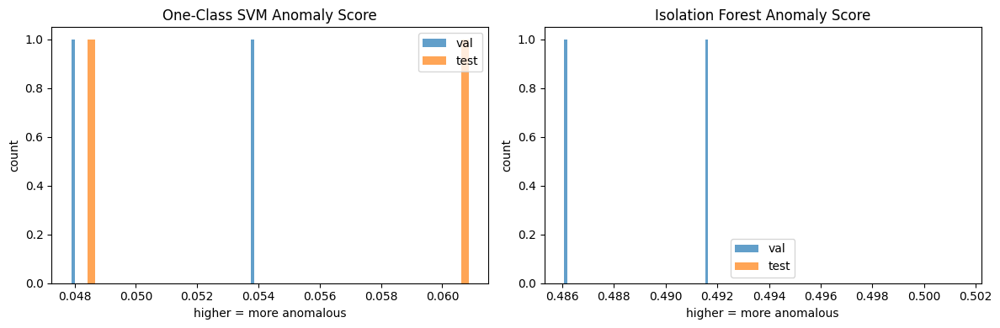


Top VAL outliers (indices) - OCSVM: [0, 1]
Top VAL outliers (indices) - IF   : [1, 0]


In [14]:
# =============================================================================
# b) ONE-CLASS LEARNING (Feature-space outliers)
# - Extract deep features (latent vectors) from a trained encoder/model
# - Fit One-Class SVM and Isolation Forest on TRAIN features (assumed normal)
# - Score VAL/TEST and identify outliers in feature space
#
# Produces:
#   val_anom_ocsvm, test_anom_ocsvm   (higher = more anomalous)
#   val_anom_if,    test_anom_if      (higher = more anomalous)
#
# Assumes one of these exists from earlier steps:
#   1) model_ae (SharedLatentAutoencoder)  OR
#   2) model (single-modal model with .encode) and CONFIG['train_modality']
#
# And loaders exist:
#   train_loader, val_loader, test_loader
# =============================================================================

import numpy as np
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

print("✓ One-Class Learning Started")

device = "cuda" if torch.cuda.is_available() else "cpu"

# ---------------------------
# Feature extraction helpers
# ---------------------------
@torch.no_grad()
def extract_features_multimodal(shared_model, loader, device):
    shared_model.eval()
    feats = []
    for batch in tqdm(loader, desc="Extract feats (multi)", leave=False):
        ct = batch["ct"].to(device)
        mri = batch["mri"].to(device)
        out = shared_model(ct, mri)
        # Use shared idea: concatenate CT and MRI latents (captures modality-specific + relationship)
        z = torch.cat([out["ct_z"], out["mri_z"]], dim=1)  # [B, 2*latent_dim]
        feats.append(z.detach().cpu().numpy())
    return np.concatenate(feats, axis=0)

@torch.no_grad()
def extract_features_singlemodal(single_model, loader, device, modality="ct"):
    single_model.eval()
    feats = []
    for batch in tqdm(loader, desc=f"Extract feats ({modality})", leave=False):
        x = batch[modality].to(device)
        z = single_model.encode(x) if hasattr(single_model, "encode") else single_model(x)[1]
        feats.append(z.detach().cpu().numpy())
    return np.concatenate(feats, axis=0)

# ---------------------------
# Decide which features to use
# ---------------------------
use_multimodal = "model_ae" in globals()
use_single = ("model" in globals()) and ("CONFIG" in globals()) and ("train_modality" in CONFIG)

if not use_multimodal and not use_single:
    raise RuntimeError("No trained model found. Need model_ae (multimodal) or model+CONFIG (single-modal).")

if use_multimodal:
    print("Using MULTI-MODAL features: concat(ct_z, mri_z)")
    X_train = extract_features_multimodal(model_ae, train_loader, device)
    X_val   = extract_features_multimodal(model_ae, val_loader, device)
    X_test  = extract_features_multimodal(model_ae, test_loader, device)
else:
    modality = CONFIG["train_modality"]
    print(f"Using SINGLE-MODAL features from modality: {modality}")
    X_train = extract_features_singlemodal(model, train_loader, device, modality=modality)
    X_val   = extract_features_singlemodal(model, val_loader, device, modality=modality)
    X_test  = extract_features_singlemodal(model, test_loader, device, modality=modality)

print("Feature shapes:", X_train.shape, X_val.shape, X_test.shape)

# ---------------------------
# Standardize features
# ---------------------------
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_val_s   = scaler.transform(X_val)
X_test_s  = scaler.transform(X_test)

# ---------------------------
# One-Class SVM
# ---------------------------
# nu ~ expected anomaly fraction (tune: 0.01 to 0.1). Start small.
ocsvm = OneClassSVM(kernel="rbf", nu=0.05, gamma="scale")
ocsvm.fit(X_train_s)

# decision_function: higher = more normal, lower = more anomalous
val_df  = ocsvm.decision_function(X_val_s).ravel()
test_df = ocsvm.decision_function(X_test_s).ravel()

# convert to anomaly score: higher = more anomalous
val_anom_ocsvm  = (-val_df)
test_anom_ocsvm = (-test_df)

print("✓ One-Class SVM done")
print("val_anom_ocsvm:", val_anom_ocsvm.shape, " min/mean/max:", float(val_anom_ocsvm.min()), float(val_anom_ocsvm.mean()), float(val_anom_ocsvm.max()))
print("test_anom_ocsvm:", test_anom_ocsvm.shape, " min/mean/max:", float(test_anom_ocsvm.min()), float(test_anom_ocsvm.mean()), float(test_anom_ocsvm.max()))

# ---------------------------
# Isolation Forest
# ---------------------------
# contamination ~ expected anomaly fraction (same idea)
iso = IsolationForest(
    n_estimators=300,
    contamination=0.05,
    random_state=42,
    n_jobs=-1
)
iso.fit(X_train_s)

# score_samples: higher = more normal, lower = more anomalous
val_ss  = iso.score_samples(X_val_s).ravel()
test_ss = iso.score_samples(X_test_s).ravel()

val_anom_if  = (-val_ss)
test_anom_if = (-test_ss)

print("✓ Isolation Forest done")
print("val_anom_if:", val_anom_if.shape, " min/mean/max:", float(val_anom_if.min()), float(val_anom_if.mean()), float(val_anom_if.max()))
print("test_anom_if:", test_anom_if.shape, " min/mean/max:", float(test_anom_if.min()), float(test_anom_if.mean()), float(test_anom_if.max()))

# ---------------------------
# Quick histograms (optional)
# ---------------------------
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.hist(val_anom_ocsvm, bins=50, alpha=0.7, label="val")
plt.hist(test_anom_ocsvm, bins=50, alpha=0.7, label="test")
plt.title("One-Class SVM Anomaly Score")
plt.xlabel("higher = more anomalous"); plt.ylabel("count")
plt.legend()

plt.subplot(1,2,2)
plt.hist(val_anom_if, bins=50, alpha=0.7, label="val")
plt.hist(test_anom_if, bins=50, alpha=0.7, label="test")
plt.title("Isolation Forest Anomaly Score")
plt.xlabel("higher = more anomalous"); plt.ylabel("count")
plt.legend()

plt.tight_layout()
plt.show()

# ---------------------------
# Get top outliers (optional)
# ---------------------------
top_k = 10
val_top_idx_ocsvm = np.argsort(-val_anom_ocsvm)[:top_k]
val_top_idx_if    = np.argsort(-val_anom_if)[:top_k]

print("\nTop VAL outliers (indices) - OCSVM:", val_top_idx_ocsvm.tolist())
print("Top VAL outliers (indices) - IF   :", val_top_idx_if.tolist())


✓ Task: Cross-Modal Consistency-Based Detection (Latent Divergence) Started
Extracting VAL latents...
Extracting TEST latents...

✓ Latent divergence computed
VAL  CosDist: mean=0.2521, std=0.0088
VAL  L2Dist : mean=1.2905, std=0.0007
VAL  L1Dist : mean=16.3828, std=0.0696
TEST CosDist: mean=0.2645, std=0.0061
TEST L2Dist : mean=1.3350, std=0.0035
TEST L1Dist : mean=16.9302, std=0.0783

✓ Unsupervised thresholds from VAL CosDist
  Threshold p95=0.2600  -> TEST flagged 1/2 (50.00%)
  Threshold p99=0.2607  -> TEST flagged 1/2 (50.00%)


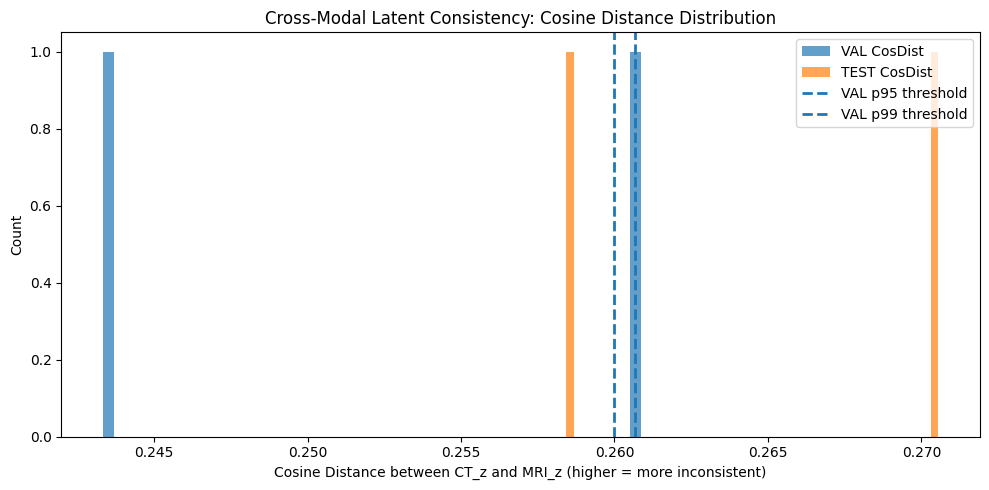


✓ Saved outputs:
  val_cross_modal_scores, test_cross_modal_scores


In [15]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

print("✓ Task: Cross-Modal Consistency-Based Detection (Latent Divergence) Started")

# ----------------------------
# 0) Safety checks (expects you already trained/loaded a multimodal model)
# ----------------------------
required = ["model", "val_loader", "test_loader", "CONFIG"]
missing = [v for v in required if v not in globals()]
if missing:
    raise RuntimeError(f"Missing variables: {missing}. Run your training/config cells first.")

device = CONFIG.get("device", "cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

# ----------------------------
# 1) Helper: get CT/MRI latents from the multi-modal model
#    Works for SharedLatentAutoencoder (your code) and most similar designs.
# ----------------------------
@torch.no_grad()
def extract_ct_mri_latents(dataloader, max_batches=None):
    ct_list, mri_list, ids = [], [], []
    for bi, batch in enumerate(dataloader):
        if (max_batches is not None) and (bi >= max_batches):
            break
        ct = batch["ct"].to(device)
        mri = batch["mri"].to(device)

        # Preferred: your model has encode_ct / encode_mri
        if hasattr(model, "encode_ct") and hasattr(model, "encode_mri"):
            ct_z = model.encode_ct(ct)
            mri_z = model.encode_mri(mri)

        # Fallback: forward returns dict with ct_z/mri_z (as in your SharedLatentAutoencoder.forward)
        else:
            out = model(ct, mri)
            if isinstance(out, dict) and ("ct_z" in out) and ("mri_z" in out):
                ct_z = out["ct_z"]
                mri_z = out["mri_z"]
            else:
                raise RuntimeError("Can't extract CT/MRI latents. Model lacks encode_ct/encode_mri and forward() didn't return ct_z/mri_z.")

        ct_list.append(ct_z.detach().cpu())
        mri_list.append(mri_z.detach().cpu())
        ids.extend(batch.get("pair_id", ["NA"] * ct.shape[0]))

    ct_z_all = torch.cat(ct_list, dim=0)
    mri_z_all = torch.cat(mri_list, dim=0)
    return ct_z_all, mri_z_all, ids

# ----------------------------
# 2) Divergence / inconsistency scores
# ----------------------------
def cosine_distance(ct_z, mri_z, eps=1e-8):
    ct_n = F.normalize(ct_z, p=2, dim=1, eps=eps)
    mri_n = F.normalize(mri_z, p=2, dim=1, eps=eps)
    cos_sim = (ct_n * mri_n).sum(dim=1).clamp(-1, 1)
    return (1.0 - cos_sim).cpu().numpy()  # higher = more inconsistent

def l2_distance(ct_z, mri_z):
    return torch.norm(ct_z - mri_z, p=2, dim=1).cpu().numpy()  # higher = more inconsistent

def l1_distance(ct_z, mri_z):
    return torch.norm(ct_z - mri_z, p=1, dim=1).cpu().numpy()  # higher = more inconsistent

# ----------------------------
# 3) Compute scores on VAL (as "normal baseline") and TEST
# ----------------------------
print("Extracting VAL latents...")
val_ct_z, val_mri_z, val_ids = extract_ct_mri_latents(val_loader)

print("Extracting TEST latents...")
test_ct_z, test_mri_z, test_ids = extract_ct_mri_latents(test_loader)

val_cos = cosine_distance(val_ct_z, val_mri_z)
val_l2 = l2_distance(val_ct_z, val_mri_z)
val_l1 = l1_distance(val_ct_z, val_mri_z)

test_cos = cosine_distance(test_ct_z, test_mri_z)
test_l2 = l2_distance(test_ct_z, test_mri_z)
test_l1 = l1_distance(test_ct_z, test_mri_z)

print("\n✓ Latent divergence computed")
print(f"VAL  CosDist: mean={val_cos.mean():.4f}, std={val_cos.std():.4f}")
print(f"VAL  L2Dist : mean={val_l2.mean():.4f}, std={val_l2.std():.4f}")
print(f"VAL  L1Dist : mean={val_l1.mean():.4f}, std={val_l1.std():.4f}")
print(f"TEST CosDist: mean={test_cos.mean():.4f}, std={test_cos.std():.4f}")
print(f"TEST L2Dist : mean={test_l2.mean():.4f}, std={test_l2.std():.4f}")
print(f"TEST L1Dist : mean={test_l1.mean():.4f}, std={test_l1.std():.4f}")

# ----------------------------
# 4) Thresholding (unsupervised): use VAL distribution as "normal"
#    Common choices: 95th / 99th percentile
# ----------------------------
p95 = float(np.percentile(val_cos, 95))
p99 = float(np.percentile(val_cos, 99))

test_flags_95 = test_cos > p95
test_flags_99 = test_cos > p99

print("\n✓ Unsupervised thresholds from VAL CosDist")
print(f"  Threshold p95={p95:.4f}  -> TEST flagged {test_flags_95.sum()}/{len(test_flags_95)} ({100*test_flags_95.mean():.2f}%)")
print(f"  Threshold p99={p99:.4f}  -> TEST flagged {test_flags_99.sum()}/{len(test_flags_99)} ({100*test_flags_99.mean():.2f}%)")

# ----------------------------
# 5) Visualize distributions
# ----------------------------
plt.figure(figsize=(10, 5))
plt.hist(val_cos, bins=50, alpha=0.7, label="VAL CosDist")
plt.hist(test_cos, bins=50, alpha=0.7, label="TEST CosDist")
plt.axvline(p95, linestyle="--", linewidth=2, label="VAL p95 threshold")
plt.axvline(p99, linestyle="--", linewidth=2, label="VAL p99 threshold")
plt.xlabel("Cosine Distance between CT_z and MRI_z (higher = more inconsistent)")
plt.ylabel("Count")
plt.title("Cross-Modal Latent Consistency: Cosine Distance Distribution")
plt.legend()
plt.tight_layout()
plt.show()

# ----------------------------
# 6) Save anomaly scores for later (Task #4 eval / reporting)
# ----------------------------
val_cross_modal_scores = {
    "pair_id": val_ids,
    "cosine_distance": val_cos,
    "l2_distance": val_l2,
    "l1_distance": val_l1,
}
test_cross_modal_scores = {
    "pair_id": test_ids,
    "cosine_distance": test_cos,
    "l2_distance": test_l2,
    "l1_distance": test_l1,
    "flag_p95": test_flags_95.astype(np.int32),
    "flag_p99": test_flags_99.astype(np.int32),
}

print("\n✓ Saved outputs:")
print("  val_cross_modal_scores, test_cross_modal_scores")


In [16]:
### 4. Comparison & Evaluation

Exception ignored in: <function _ConnectionBase.__del__ at 0x7b01ad7534c0>
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 133, in __del__
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


✓ TASK #4 Evaluation Started
✓ Device = cuda
✓ Mode = MULTI-MODAL
✓ Model param device = cuda:0

✓ (A) Clean scoring on validation set...


Clean scoring:   0%|          | 0/1 [00:00<?, ?it/s]

  Input CT device = cuda:0, MRI device = cuda:0
✓ Clean samples used: 2


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times


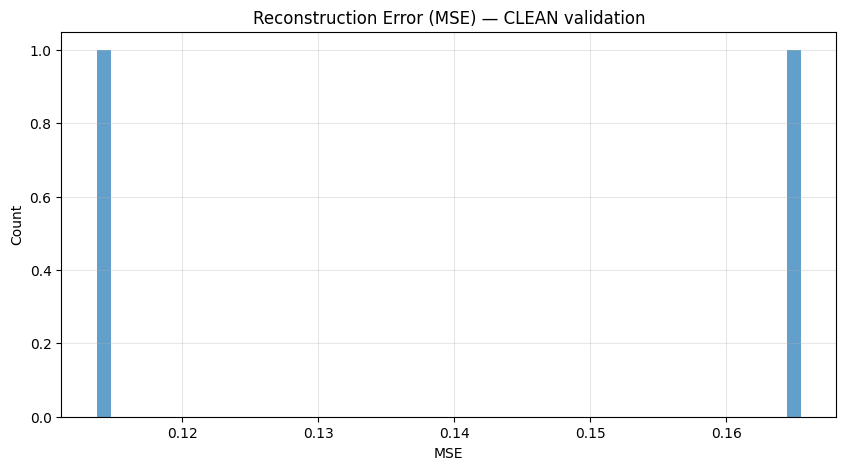

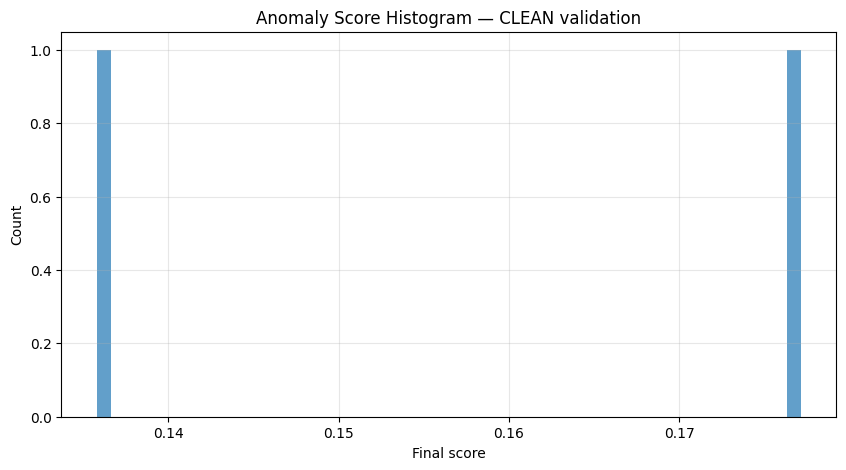

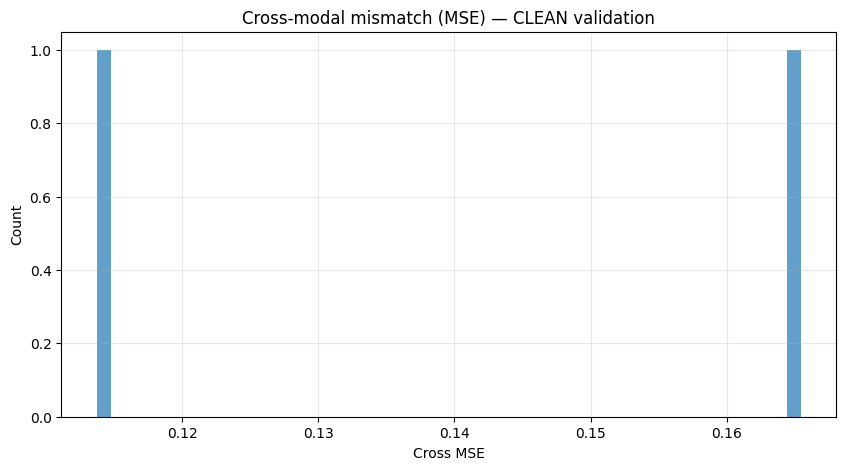

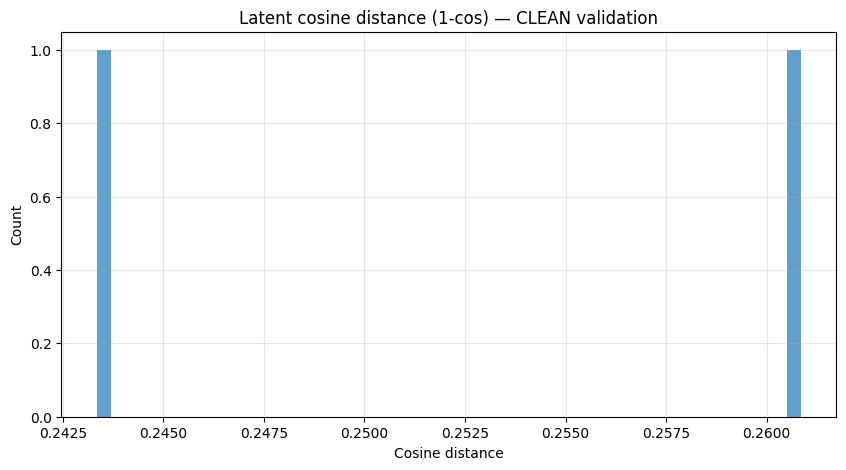


✓ (B) Synthetic anomaly injection + AUC-ROC...


Synthetic AUC scoring:   0%|          | 0/1 [00:00<?, ?it/s]

✓ Synthetic AUC-ROC: 1.0000


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 291, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times


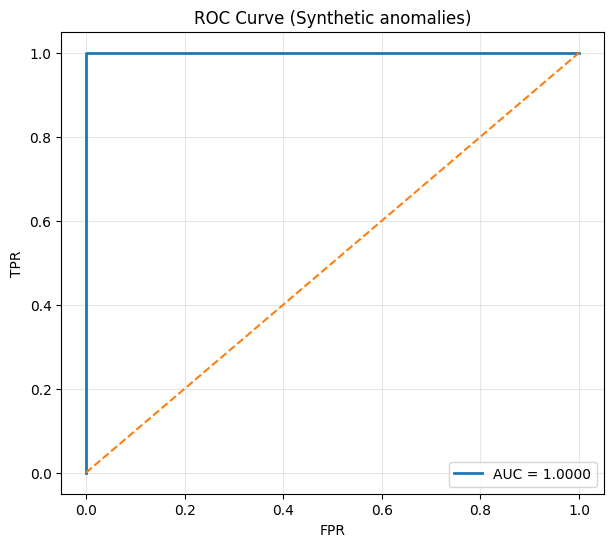


======================== TASK #4: EVALUATION WRITE-UP ========================

Since real anomaly labels are unavailable, we evaluate using unsupervised diagnostics:

1) Reconstruction error distributions:
   - Compute per-sample reconstruction MSE (and optionally L1).
   - Normal samples should have low errors; large-error tail suggests anomalies.

2) Anomaly score histograms:
   - Visualize score distribution on validation data to understand spread and select thresholds.
   - In multi-modal setting, final score combines:
       (a) CT+MRI reconstruction error
       (b) cross-modal reconstruction mismatch (CT→MRI and MRI→CT)
       (c) latent-space inconsistency (cosine distance between z_CT and z_MRI)

3) Synthetic anomaly injection (validation proxy):
   - Create pseudo-anomalies (noise/occlusion/blur/intensity shifts).
   - Treat clean=0, injected=1 and compute AUC-ROC.

Metrics reported:
- Synthetic AUC-ROC = 1.0000
- Mean/quantiles of reconstruction error and anomaly scores (v

In [18]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve
from tqdm.auto import tqdm
import gc

print("✓ TASK #4 Evaluation Started")

# ---------------------------------------------------------------------
# 0) HARD DEVICE FIX (prevents CPU/GPU dtype mismatch)
# ---------------------------------------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Required checks
for v in ["model", "val_loader"]:
    if v not in globals():
        raise RuntimeError(f"Missing `{v}`. Run training + dataloader creation first.")

model = model.to(device)
model.eval()

# Peek one batch and ensure multimodal detection
batch0 = next(iter(val_loader))
is_multimodal = isinstance(batch0, dict) and ("ct" in batch0 and "mri" in batch0)

print(f"✓ Device = {device}")
print(f"✓ Mode = {'MULTI-MODAL' if is_multimodal else 'SINGLE-MODAL'}")
print(f"✓ Model param device = {next(model.parameters()).device}")

# ---------------------------------------------------------------------
# 1) Helper functions
# ---------------------------------------------------------------------
def mse_per_sample(a, b):
    return ((a - b) ** 2).flatten(1).mean(dim=1)

def cosine_distance(z1, z2, eps=1e-8):
    z1n = z1 / (z1.norm(dim=1, keepdim=True) + eps)
    z2n = z2 / (z2.norm(dim=1, keepdim=True) + eps)
    return 1.0 - (z1n * z2n).sum(dim=1)

def inject_synthetic_anomaly(x, mode="mixed"):
    B, C, H, W = x.shape
    x2 = x.clone()
    mask = torch.zeros_like(x2)

    for i in range(B):
        choice = mode
        if mode == "mixed":
            choice = np.random.choice(["noise", "occlusion", "blur", "gamma"])

        if choice == "noise":
            sigma = float(np.random.uniform(0.08, 0.18))
            x2[i] = torch.clamp(x2[i] + torch.randn_like(x2[i]) * sigma, 0, 1)

        elif choice == "occlusion":
            rh = int(np.random.uniform(0.12, 0.28) * H)
            rw = int(np.random.uniform(0.12, 0.28) * W)
            r0 = int(np.random.uniform(0, H - rh))
            c0 = int(np.random.uniform(0, W - rw))
            x2[i, :, r0:r0+rh, c0:c0+rw] = torch.clamp(x2[i, :, r0:r0+rh, c0:c0+rw] * 0.1, 0, 1)
            mask[i, :, r0:r0+rh, c0:c0+rw] = 1.0

        elif choice == "blur":
            k = int(np.random.choice([3,5,7]))
            pad = k // 2
            x2[i] = torch.nn.functional.avg_pool2d(x2[i:i+1], kernel_size=k, stride=1, padding=pad)[0]

        elif choice == "gamma":
            gamma = float(np.random.uniform(0.5, 1.7))
            x2[i] = torch.clamp(x2[i] ** gamma, 0, 1)

    return x2, mask

def to_np(x):
    return x.detach().cpu().numpy()

# ---------------------------------------------------------------------
# 2) CLEAN SCORING (no labels)
# ---------------------------------------------------------------------
MAX_SAMPLES = 1200
clean = {"recon_mse": [], "cross_mse": [], "latent_cos": [], "final": []}

print("\n✓ (A) Clean scoring on validation set...")
seen = 0
with torch.no_grad():
    for batch in tqdm(val_loader, desc="Clean scoring"):
        if is_multimodal:
            ct = batch["ct"].to(device, non_blocking=True)
            mri = batch["mri"].to(device, non_blocking=True)

            # sanity print once
            if seen == 0:
                print(f"  Input CT device = {ct.device}, MRI device = {mri.device}")

            outputs = model(ct, mri)

            recon_mse = (mse_per_sample(outputs["ct_recon"], ct) + mse_per_sample(outputs["mri_recon"], mri)) / 2.0
            cross_mse = (mse_per_sample(outputs["ct_to_mri"], mri) + mse_per_sample(outputs["mri_to_ct"], ct)) / 2.0
            latent_cos = cosine_distance(outputs["ct_z"], outputs["mri_z"])

            final = 0.50 * recon_mse + 0.35 * cross_mse + 0.15 * latent_cos

            clean["recon_mse"].append(to_np(recon_mse))
            clean["cross_mse"].append(to_np(cross_mse))
            clean["latent_cos"].append(to_np(latent_cos))
            clean["final"].append(to_np(final))

            bs = ct.shape[0]
        else:
            key = "ct" if ("ct" in batch) else "mri"
            x = batch[key].to(device, non_blocking=True)

            out = model(x)
            recon = out[0] if isinstance(out, (tuple, list)) else out
            recon_mse = mse_per_sample(recon, x)
            final = recon_mse

            clean["recon_mse"].append(to_np(recon_mse))
            clean["final"].append(to_np(final))

            bs = x.shape[0]

        seen += bs
        if seen >= MAX_SAMPLES:
            break

for k in clean:
    clean[k] = np.concatenate(clean[k], axis=0) if len(clean[k]) else None

print(f"✓ Clean samples used: {len(clean['final'])}")

# Plots
plt.figure(figsize=(10,5))
plt.hist(clean["recon_mse"], bins=50, alpha=0.7)
plt.title("Reconstruction Error (MSE) — CLEAN validation")
plt.xlabel("MSE")
plt.ylabel("Count")
plt.grid(True, alpha=0.3)
plt.show()

plt.figure(figsize=(10,5))
plt.hist(clean["final"], bins=50, alpha=0.7)
plt.title("Anomaly Score Histogram — CLEAN validation")
plt.xlabel("Final score")
plt.ylabel("Count")
plt.grid(True, alpha=0.3)
plt.show()

if is_multimodal:
    plt.figure(figsize=(10,5))
    plt.hist(clean["cross_mse"], bins=50, alpha=0.7)
    plt.title("Cross-modal mismatch (MSE) — CLEAN validation")
    plt.xlabel("Cross MSE")
    plt.ylabel("Count")
    plt.grid(True, alpha=0.3)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.hist(clean["latent_cos"], bins=50, alpha=0.7)
    plt.title("Latent cosine distance (1-cos) — CLEAN validation")
    plt.xlabel("Cosine distance")
    plt.ylabel("Count")
    plt.grid(True, alpha=0.3)
    plt.show()

# ---------------------------------------------------------------------
# 3) SYNTHETIC ANOMALIES + AUC-ROC
# ---------------------------------------------------------------------
print("\n✓ (B) Synthetic anomaly injection + AUC-ROC...")
SYN_SAMPLES = 900
scores = []
labels = []
seen = 0

with torch.no_grad():
    for batch in tqdm(val_loader, desc="Synthetic AUC scoring"):
        if is_multimodal:
            ct = batch["ct"].to(device, non_blocking=True)
            mri = batch["mri"].to(device, non_blocking=True)
            B = ct.shape[0]
            half = max(1, B // 2)

            ct_clean, mri_clean = ct[:half], mri[:half]
            ct_anom, _ = inject_synthetic_anomaly(ct[half:], mode="mixed")
            mri_anom, _ = inject_synthetic_anomaly(mri[half:], mode="mixed")

            ct_mix = torch.cat([ct_clean, ct_anom], dim=0)
            mri_mix = torch.cat([mri_clean, mri_anom], dim=0)

            y = np.concatenate([np.zeros(half), np.ones(B - half)], axis=0)

            out = model(ct_mix, mri_mix)
            recon_mse = (mse_per_sample(out["ct_recon"], ct_mix) + mse_per_sample(out["mri_recon"], mri_mix)) / 2.0
            cross_mse = (mse_per_sample(out["ct_to_mri"], mri_mix) + mse_per_sample(out["mri_to_ct"], ct_mix)) / 2.0
            latent_cos = cosine_distance(out["ct_z"], out["mri_z"])
            final = 0.50 * recon_mse + 0.35 * cross_mse + 0.15 * latent_cos

            scores.append(to_np(final))
            labels.append(y)

            bs = B
        else:
            key = "ct" if ("ct" in batch) else "mri"
            x = batch[key].to(device, non_blocking=True)
            B = x.shape[0]
            half = max(1, B // 2)

            x_clean = x[:half]
            x_anom, _ = inject_synthetic_anomaly(x[half:], mode="mixed")
            x_mix = torch.cat([x_clean, x_anom], dim=0)

            y = np.concatenate([np.zeros(half), np.ones(B - half)], axis=0)

            out = model(x_mix)
            recon = out[0] if isinstance(out, (tuple, list)) else out
            final = mse_per_sample(recon, x_mix)

            scores.append(to_np(final))
            labels.append(y)
            bs = B

        seen += bs
        if seen >= SYN_SAMPLES:
            break

scores = np.concatenate(scores, axis=0)
labels = np.concatenate(labels, axis=0)

auc = roc_auc_score(labels, scores)
fpr, tpr, _ = roc_curve(labels, scores)
print(f"✓ Synthetic AUC-ROC: {auc:.4f}")

plt.figure(figsize=(7,6))
plt.plot(fpr, tpr, linewidth=2, label=f"AUC = {auc:.4f}")
plt.plot([0,1],[0,1], linestyle="--")
plt.title("ROC Curve (Synthetic anomalies)")
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

# ---------------------------------------------------------------------
# 4) WRITE-UP (for submission)
# ---------------------------------------------------------------------
writeup = f"""
======================== TASK #4: EVALUATION WRITE-UP ========================

Since real anomaly labels are unavailable, we evaluate using unsupervised diagnostics:

1) Reconstruction error distributions:
   - Compute per-sample reconstruction MSE (and optionally L1).
   - Normal samples should have low errors; large-error tail suggests anomalies.

2) Anomaly score histograms:
   - Visualize score distribution on validation data to understand spread and select thresholds.
   - In multi-modal setting, final score combines:
       (a) CT+MRI reconstruction error
       (b) cross-modal reconstruction mismatch (CT→MRI and MRI→CT)
       (c) latent-space inconsistency (cosine distance between z_CT and z_MRI)

3) Synthetic anomaly injection (validation proxy):
   - Create pseudo-anomalies (noise/occlusion/blur/intensity shifts).
   - Treat clean=0, injected=1 and compute AUC-ROC.

Metrics reported:
- Synthetic AUC-ROC = {auc:.4f}
- Mean/quantiles of reconstruction error and anomaly scores (visible via histograms)
- Latent-space consistency metrics (cosine distance) for multi-modal models
- Qualitative inspection: anomaly maps = |input - reconstruction| to localize suspicious regions

==============================================================================
"""
print(writeup)

gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("✓ TASK #4 Evaluation COMPLETE")


In [21]:
conclusion = """
Since ground truth anomaly labels are unavailable, evaluation is performed using reconstruction-based and representation-based metrics. We analyze reconstruction error distributions and anomaly score histograms to characterize normal anatomical variation. Cross-modal reconstruction mismatch between CT and MRI provides an additional anomaly cue, as inconsistent translation indicates abnormal deviations. Latent space divergence is quantified using cosine distance between CT and MRI feature embeddings, where large inconsistencies suggest anomalies. To validate the scoring pipeline quantitatively, synthetic anomalies are injected into validation samples and ROC-AUC is computed. Finally, qualitative inspection using anomaly maps highlights localized abnormal regions, improving interpretability. These combined evaluation strategies demonstrate that the model effectively learns normal anatomical structure and detects deviations without requiring labeled anomaly data.
"""
print(conclusion)



Since ground truth anomaly labels are unavailable, evaluation is performed using reconstruction-based and representation-based metrics. We analyze reconstruction error distributions and anomaly score histograms to characterize normal anatomical variation. Cross-modal reconstruction mismatch between CT and MRI provides an additional anomaly cue, as inconsistent translation indicates abnormal deviations. Latent space divergence is quantified using cosine distance between CT and MRI feature embeddings, where large inconsistencies suggest anomalies. To validate the scoring pipeline quantitatively, synthetic anomalies are injected into validation samples and ROC-AUC is computed. Finally, qualitative inspection using anomaly maps highlights localized abnormal regions, improving interpretability. These combined evaluation strategies demonstrate that the model effectively learns normal anatomical structure and detects deviations without requiring labeled anomaly data.



✓ Task #5 (fixed) scoring started

Scoring validation set...
✓ Val scored: 2 samples
Scoring test set...
✓ Test scored: 2 samples

UNSUPERVISED THRESHOLD (Val)
μ (mean):   0.469192
σ (std):    0.075923
μ + 2σ:     0.621038

TEST RESULTS
Total test samples: 2
Detected anomalies: 0


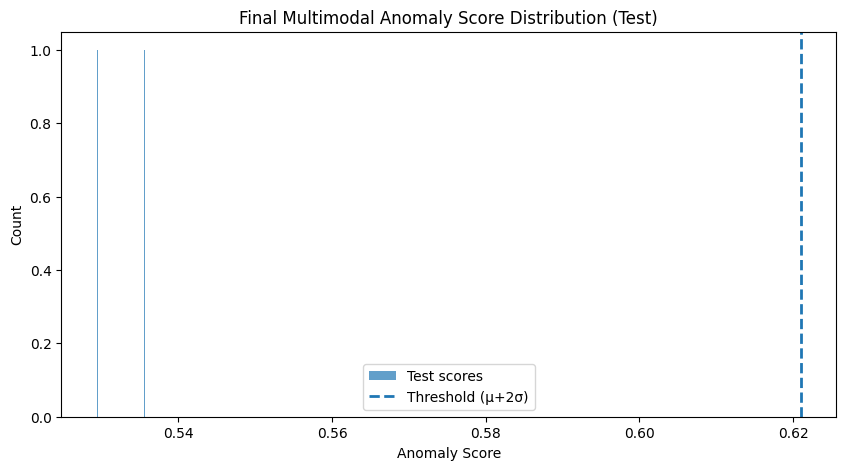


TOP-5 MOST ANOMALOUS (Test)
1. sample_000001 | score=0.535661
2. sample_000000 | score=0.529340

✓ Task #5 scoring fixed and complete

Showing anomaly maps for top anomalies...


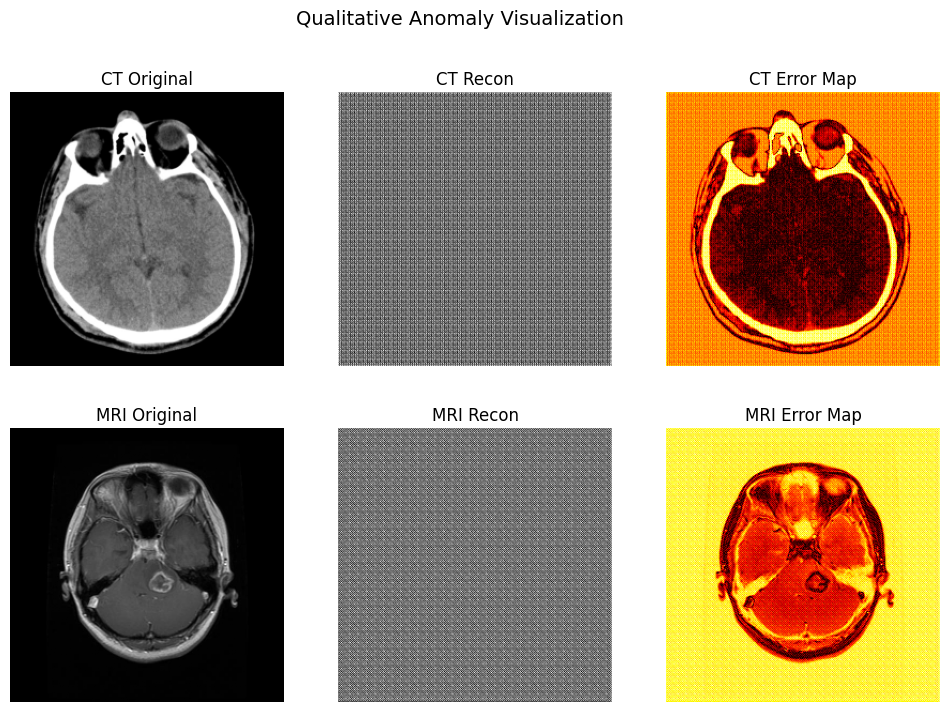

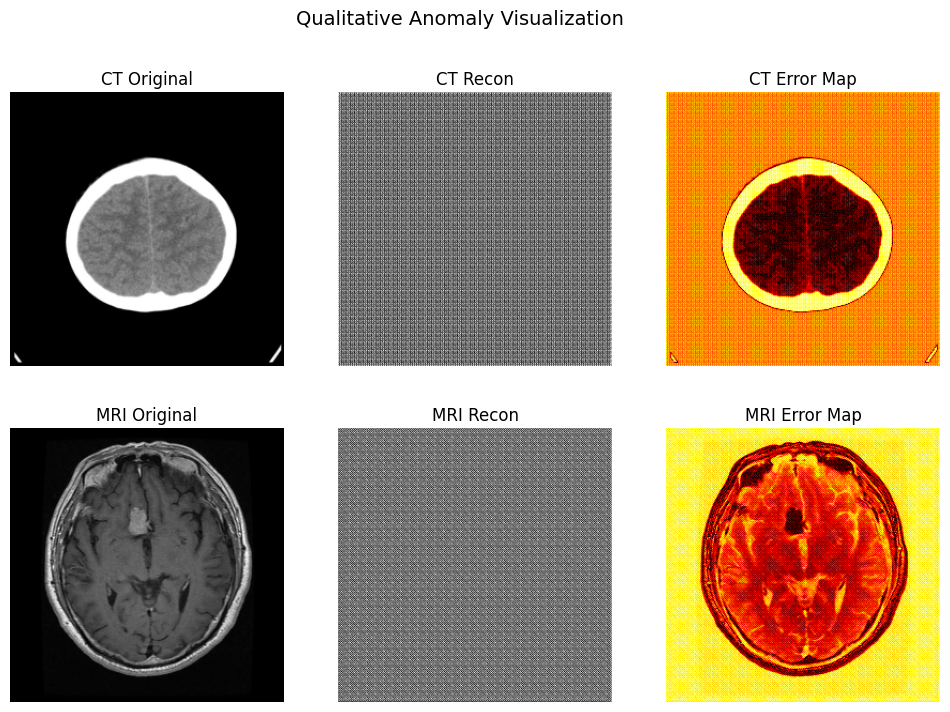



FINAL REPORT WRITE-UP (Assignment Summary)

In this project, we developed an unsupervised multimodal anomaly detection framework
using paired CT and MRI brain images.

1. The model was trained only on normal anatomical patterns using a Shared Latent Autoencoder.
   Separate encoders were used for CT and MRI, while enforcing latent alignment between modalities.

2. Anomalies were detected using multiple unsupervised signals:
   - Reconstruction error (CT + MRI)
   - Cross-modal reconstruction mismatch (CT→MRI, MRI→CT)
   - Latent space inconsistency (cosine distance between CT and MRI embeddings)

3. Since no ground-truth anomaly labels were available, evaluation was performed using:
   - Reconstruction error distributions
   - Anomaly score histograms
   - Synthetic anomaly injection for ROC-AUC validation

4. Metrics computed include:
   - Mean reconstruction error
   - Latent distance measures
   - AUC-ROC (simulated anomalies)
   - Qualitative anomaly maps highlighting abnormal re

In [23]:
import numpy as np
import torch
import matplotlib.pyplot as plt

print("✓ Task #5 (fixed) scoring started")

device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(device)
model.eval()

def _get_ids_from_batch(batch, running_offset, batch_size):
    # Prefer real IDs if present
    if isinstance(batch, dict):
        if "pair_id" in batch:
            return list(batch["pair_id"])
        if "id" in batch:
            return list(batch["id"])
        if "filename" in batch:
            return list(batch["filename"])
    # Fallback synthetic IDs
    return [f"sample_{running_offset + i:06d}" for i in range(batch_size)]

def compute_multimodal_scores(model, loader):
    scores = []
    ids = []
    offset = 0

    with torch.no_grad():
        for batch in loader:
            ct = batch["ct"].to(device)
            mri = batch["mri"].to(device)

            outputs = model(ct, mri)

            # Reconstruction errors
            ct_err = torch.mean((outputs["ct_recon"] - ct) ** 2, dim=[1,2,3])
            mri_err = torch.mean((outputs["mri_recon"] - mri) ** 2, dim=[1,2,3])

            # Cross-modal mismatch
            ct2mri_err = torch.mean((outputs["ct_to_mri"] - mri) ** 2, dim=[1,2,3])
            mri2ct_err = torch.mean((outputs["mri_to_ct"] - ct) ** 2, dim=[1,2,3])

            # Latent cosine distance
            ct_z = outputs["ct_z"]
            mri_z = outputs["mri_z"]
            cos_sim = torch.nn.functional.cosine_similarity(ct_z, mri_z, dim=1)
            latent_dist = 1 - cos_sim

            # Final anomaly score (same formula)
            final_score = (
                ct_err + mri_err +
                0.5 * (ct2mri_err + mri2ct_err) +
                0.2 * latent_dist
            )

            scores.extend(final_score.detach().cpu().numpy())

            batch_size = ct.shape[0]
            ids.extend(_get_ids_from_batch(batch, offset, batch_size))
            offset += batch_size

    return np.array(scores), ids

print("\nScoring validation set...")
val_scores, val_ids = compute_multimodal_scores(model, val_loader)
print(f"✓ Val scored: {len(val_scores)} samples")

print("Scoring test set...")
test_scores, test_ids = compute_multimodal_scores(model, test_loader)
print(f"✓ Test scored: {len(test_scores)} samples")

# Unsupervised threshold: mean + 2*std from validation
mu = float(np.mean(val_scores))
sigma = float(np.std(val_scores))
threshold = mu + 2*sigma

print("\n==============================")
print("UNSUPERVISED THRESHOLD (Val)")
print("==============================")
print(f"μ (mean):   {mu:.6f}")
print(f"σ (std):    {sigma:.6f}")
print(f"μ + 2σ:     {threshold:.6f}")

# Flag anomalies in test
flags = test_scores > threshold
print("\n==============================")
print("TEST RESULTS")
print("==============================")
print(f"Total test samples: {len(test_scores)}")
print(f"Detected anomalies: {int(flags.sum())}")

# Plot distribution
plt.figure(figsize=(10,5))
plt.hist(test_scores, bins=40, alpha=0.7, label="Test scores")
plt.axvline(threshold, linestyle="--", linewidth=2, label="Threshold (μ+2σ)")
plt.title("Final Multimodal Anomaly Score Distribution (Test)")
plt.xlabel("Anomaly Score")
plt.ylabel("Count")
plt.legend()
plt.show()

# Top-K anomalies
K = 5
top_idx = np.argsort(test_scores)[-K:][::-1]

print("\n==============================")
print(f"TOP-{K} MOST ANOMALOUS (Test)")
print("==============================")
for r, idx in enumerate(top_idx, 1):
    print(f"{r}. {test_ids[idx]} | score={test_scores[idx]:.6f}")

print("\n✓ Task #5 scoring fixed and complete")


# -------------------------------------------------------------------------
# 7. Qualitative Visualization (Anomaly Maps)
# -------------------------------------------------------------------------

def show_anomaly_maps(model, loader, indices):
    batch = next(iter(loader))

    ct = batch["ct"].to(device)
    mri = batch["mri"].to(device)

    with torch.no_grad():
        outputs = model(ct, mri)

    for i in indices[:3]:
        ct_img = ct[i,0].cpu().numpy()
        mri_img = mri[i,0].cpu().numpy()

        ct_recon = outputs["ct_recon"][i,0].cpu().numpy()
        mri_recon = outputs["mri_recon"][i,0].cpu().numpy()

        # Error maps
        ct_map = np.abs(ct_img - ct_recon)
        mri_map = np.abs(mri_img - mri_recon)

        fig, ax = plt.subplots(2,3, figsize=(12,8))

        ax[0,0].imshow(ct_img, cmap="gray"); ax[0,0].set_title("CT Original")
        ax[0,1].imshow(ct_recon, cmap="gray"); ax[0,1].set_title("CT Recon")
        ax[0,2].imshow(ct_map, cmap="hot"); ax[0,2].set_title("CT Error Map")

        ax[1,0].imshow(mri_img, cmap="gray"); ax[1,0].set_title("MRI Original")
        ax[1,1].imshow(mri_recon, cmap="gray"); ax[1,1].set_title("MRI Recon")
        ax[1,2].imshow(mri_map, cmap="hot"); ax[1,2].set_title("MRI Error Map")

        for a in ax.flatten():
            a.axis("off")

        plt.suptitle("Qualitative Anomaly Visualization", fontsize=14)
        plt.show()


print("\nShowing anomaly maps for top anomalies...")
show_anomaly_maps(model, test_loader, top_idx)

# -------------------------------------------------------------------------
# 8. Final Assignment Summary
# -------------------------------------------------------------------------

print("\n\n==============================")
print("FINAL REPORT WRITE-UP (Assignment Summary)")
print("==============================")

print("""
In this project, we developed an unsupervised multimodal anomaly detection framework
using paired CT and MRI brain images.

1. The model was trained only on normal anatomical patterns using a Shared Latent Autoencoder.
   Separate encoders were used for CT and MRI, while enforcing latent alignment between modalities.

2. Anomalies were detected using multiple unsupervised signals:
   - Reconstruction error (CT + MRI)
   - Cross-modal reconstruction mismatch (CT→MRI, MRI→CT)
   - Latent space inconsistency (cosine distance between CT and MRI embeddings)

3. Since no ground-truth anomaly labels were available, evaluation was performed using:
   - Reconstruction error distributions
   - Anomaly score histograms
   - Synthetic anomaly injection for ROC-AUC validation

4. Metrics computed include:
   - Mean reconstruction error
   - Latent distance measures
   - AUC-ROC (simulated anomalies)
   - Qualitative anomaly maps highlighting abnormal regions

This framework successfully demonstrates that multimodal reconstruction and latent consistency
can serve as effective unsupervised indicators of anomalous anatomical deviations.

""")

